In [1]:
from matplotlib import pyplot as plt
from matplotlib import colors
import numpy as np
from matplotlib.patches import Path, PathPatch
import pandas as pd
from shapely.geometry import Point, shape, Polygon
from shapely.ops import unary_union, cascaded_union
from geopandas.tools import sjoin
import geopandas as gpd
from netCDF4 import Dataset
from cartopy import crs as ccrs
from cartopy.io.shapereader import Reader
from sklearn.metrics import mean_squared_error
import scipy.stats as st
from sklearn.linear_model import LinearRegression
import cartopy.feature as cfeature
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.feature import LAKES
import geopandas as gpd
from matplotlib.colors import BoundaryNorm, ListedColormap
import numpy as np
from netCDF4 import Dataset
from matplotlib.offsetbox import AnchoredText
from matplotlib.colors import TwoSlopeNorm

C:\Users\x12la\AppData\Local\Temp\ipykernel_13808\3072201630.py:8: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  from geopandas.tools import sjoin


In [2]:
# Get lat/lon from LADCO grid and find corners of domain
# this is to be used for map extents
grid='C:/Users/x12la/Desktop/latlon_ChicagoLADCO_d03.nc'
# Silly note- DO2 file uses capital LAT LON and d03 uses lowercase 
cmaq_lon,cmaq_lat=np.array(Dataset(grid)['lon']),np.array(Dataset(grid)['lat'])
llat,ulat,llon,ulon=cmaq_lat.min(), cmaq_lat.max(), cmaq_lon.min(), cmaq_lon.max()
print(llat,ulat,llon,ulon)

#CMAP 7 counties surrounding Chicago/Cook County
cmap_cty = gpd.read_file('C:/Users/x12la/Desktop/Scripts/CMAP_cty.shp')
cmap_cty = cmap_cty.to_crs('EPSG:4326')

40.210953 44.045914 -90.07886 -84.51282


In [3]:
# ============================================================
# 1) BASELINE
# ============================================================
gas_base = gpd.read_file(r"emis_mole_onroad_gas_2023_average_baseline.shp").to_crs("EPSG:4326")
diesel_base = gpd.read_file(r"emis_mole_onroad_diesel_2023_average_baseline.shp").to_crs("EPSG:4326")

common_cols = [c for c in gas_base.columns if c in diesel_base.columns]
cols_to_sum = [
    c for c in common_cols
    if c not in ["geometry", "lat", "lon", "lat_m", "lon_m"]
    and np.issubdtype(gas_base[c].dtype, np.number)
]

onroad_total_base = gas_base.copy()
onroad_total_base[cols_to_sum] = (
    gas_base[cols_to_sum].fillna(0).to_numpy()
    + diesel_base[cols_to_sum].fillna(0).to_numpy()
)

onroad_total_base_cmap = gpd.clip(onroad_total_base, cmap_cty)


# ============================================================
# 2) HDVSpatial
# ============================================================
gas_HDVSpatial = gpd.read_file(r"../2022v1_Baseline/emis_mole_onroad_gas_2023_average_HDVSpatial.shp").to_crs("EPSG:4326")
diesel_HDVSpatial = gpd.read_file(r"../2022v1_Baseline/emis_mole_onroad_diesel_2023_average_HPVSpatial.shp").to_crs("EPSG:4326")

common_cols = [c for c in gas_HDVSpatial.columns if c in diesel_HDVSpatial.columns]
cols_to_sum = [
    c for c in common_cols
    if c not in ["geometry", "lat", "lon", "lat_m", "lon_m"]
    and np.issubdtype(gas_HDVSpatial[c].dtype, np.number)
]

onroad_total_HDVSpatial = gas_HDVSpatial.copy()
onroad_total_HDVSpatial[cols_to_sum] = (
    gas_HDVSpatial[cols_to_sum].fillna(0).to_numpy()
    + diesel_HDVSpatial[cols_to_sum].fillna(0).to_numpy()
)

onroad_total_HDVSpatial_cmap = gpd.clip(onroad_total_HDVSpatial, cmap_cty)


# ============================================================
# 3) LOCUS Idling — ALL VEHICLES
# ============================================================
gas_LOCUSIdling = gpd.read_file(
    r"emis_mole_onroad_gas_2023_LOCUSIdling_annualavg.shp"
).to_crs("EPSG:4326")

diesel_LOCUSIdling = gpd.read_file(
    r"emis_mole_onroad_diesel_2023_LOCUSIdling_annualavg.shp"
).to_crs("EPSG:4326")

common_cols = [c for c in gas_LOCUSIdling.columns if c in diesel_LOCUSIdling.columns]
cols_to_sum = [
    c for c in common_cols
    if c not in ["geometry", "lat", "lon", "lat_m", "lon_m"]
    and np.issubdtype(gas_LOCUSIdling[c].dtype, np.number)
]

onroad_total_LOCUSIdling = gas_LOCUSIdling.copy()
onroad_total_LOCUSIdling[cols_to_sum] = (
    gas_LOCUSIdling[cols_to_sum].fillna(0).to_numpy()
    + diesel_LOCUSIdling[cols_to_sum].fillna(0).to_numpy()
)

onroad_total_LOCUSIdling_cmap = gpd.clip(onroad_total_LOCUSIdling, cmap_cty)


# ============================================================
# 4) LOCUS Idling — HDVSpatial
# ============================================================
gas_LOCUSIdlingHDVSpatial = gpd.read_file(
    r"emis_mole_onroad_gas_2023_LOCUSIdlingHDVSpatial_annualavg.shp"
).to_crs("EPSG:4326")

diesel_LOCUSIdlingHDVSpatial = gpd.read_file(
    r"emis_mole_onroad_diesel_2023_LOCUSIdlingHDVSpatial_annualavg.shp"
).to_crs("EPSG:4326")

common_cols = [c for c in gas_LOCUSIdlingHDVSpatial.columns if c in diesel_LOCUSIdlingHDVSpatial.columns]
cols_to_sum = [
    c for c in common_cols
    if c not in ["geometry", "lat", "lon", "lat_m", "lon_m"]
    and np.issubdtype(gas_LOCUSIdlingHDVSpatial[c].dtype, np.number)
]

onroad_total_LOCUSIdlingHDVSpatial = gas_LOCUSIdlingHDVSpatial.copy()
onroad_total_LOCUSIdlingHDVSpatial[cols_to_sum] = (
    gas_LOCUSIdlingHDVSpatial[cols_to_sum].fillna(0).to_numpy()
    + diesel_LOCUSIdlingHDVSpatial[cols_to_sum].fillna(0).to_numpy()
)

onroad_total_LOCUSIdlingHDVSpatial_cmap = gpd.clip(
    onroad_total_LOCUSIdlingHDVSpatial, cmap_cty
)
# ============================================================
# 5) Renewal
# ============================================================
gas_Renewal = gpd.read_file(
    r"emis_mole_onroad_gas_2023_Renewal_annualavg.shp"
).to_crs("EPSG:4326")

diesel_Renewal = gpd.read_file(
    r"emis_mole_onroad_diesel_2023_Renewal_annualavg.shp"
).to_crs("EPSG:4326")

common_cols = [c for c in gas_Renewal.columns if c in diesel_Renewal.columns]
cols_to_sum = [
    c for c in common_cols
    if c not in ["geometry", "lat", "lon", "lat_m", "lon_m"]
    and np.issubdtype(gas_Renewal[c].dtype, np.number)
]

onroad_total_Renewal = gas_Renewal.copy()
onroad_total_Renewal[cols_to_sum] = (
    gas_Renewal[cols_to_sum].fillna(0).to_numpy()
    + diesel_Renewal[cols_to_sum].fillna(0).to_numpy()
)

onroad_total_Renewal_cmap = gpd.clip(onroad_total_Renewal, cmap_cty)


# ============================================================
# 6) Zero Legacy Trucks / ZeroPre2010s
# ============================================================
gas_ZeroPre2010s = gpd.read_file(
    r"emis_mole_onroad_gas_2023_ZeroPre2010s_annualavg.shp"
).to_crs("EPSG:4326")

diesel_ZeroPre2010s = gpd.read_file(
    r"emis_mole_onroad_diesel_2023_ZeroPre2010s_annualavg.shp"
).to_crs("EPSG:4326")

common_cols = [c for c in gas_ZeroPre2010s.columns if c in diesel_ZeroPre2010s.columns]
cols_to_sum = [
    c for c in common_cols
    if c not in ["geometry", "lat", "lon", "lat_m", "lon_m"]
    and np.issubdtype(gas_ZeroPre2010s[c].dtype, np.number)
]

onroad_total_ZeroPre2010s = gas_ZeroPre2010s.copy()
onroad_total_ZeroPre2010s[cols_to_sum] = (
    gas_ZeroPre2010s[cols_to_sum].fillna(0).to_numpy()
    + diesel_ZeroPre2010s[cols_to_sum].fillna(0).to_numpy()
)

onroad_total_ZeroPre2010s_cmap = gpd.clip(onroad_total_ZeroPre2010s, cmap_cty)

# -----------------------
# quick sanity prints
# -----------------------
print("baseline:", onroad_total_base.shape, onroad_total_base_cmap.shape)
print("HDVSpatial:", onroad_total_HDVSpatial.shape, onroad_total_HDVSpatial_cmap.shape)
print("LOCUS idling (all):", onroad_total_LOCUSIdling.shape, onroad_total_LOCUSIdling_cmap.shape)
print("LOCUS idling (HDVSpatial):", onroad_total_LOCUSIdlingHDVSpatial.shape, onroad_total_LOCUSIdlingHDVSpatial_cmap.shape)
print("Renewal:", onroad_total_Renewal.shape, onroad_total_Renewal_cmap.shape)
print("ZeroPre2010s:", onroad_total_ZeroPre2010s.shape, onroad_total_ZeroPre2010s_cmap.shape)

baseline: (90720, 67) (6070, 67)
HDVSpatial: (90720, 67) (6070, 67)
LOCUS idling (all): (90720, 67) (6070, 67)
LOCUS idling (HDVSpatial): (90720, 67) (6070, 67)
Renewal: (90720, 67) (6070, 67)
ZeroPre2010s: (90720, 67) (6070, 67)


In [4]:
def calc_nox_peryear(gdf, cell_km=1.33):
    """
    Add 'NOX_peryear' in tons/km^2/year.
    'NO' and 'NO2' are in mol/s 
    From Google:
    NO molecular weight 30.0061 g/mol
    NO2 molecular weight 46.005 g/mol

    Maths:
    mol/s * (g/mol) -> g/s
    (g/s * 3600)/1e6 -> tons/hour
    Divide by cell area (km^2) to get tons/km^2/hour
    tons/km^2/hour * 8760 = tons/km^2/year
    """
    
    if "NOX_peryear" in gdf.columns:
        return gdf

    for col in ["NO", "NO2"]:
        if col not in gdf.columns:
            raise KeyError(f"Missing '{col}' to derive NOX_peryear.")
    area_km2 = (1.33)**2
    nox_ton_per_hr = (
        (gdf["NO"]  * 30.0061 * 3600.0 / 1e6) / area_km2 +
        (gdf["NO2"] * 46.005  * 3600.0 / 1e6) / area_km2
    )
    gdf["NOX_peryear"] = nox_ton_per_hr * 8760.0
    return gdf


def calc_pm25_peryear(gdf, species=None, cell_km=1.33):
    """
    Add 'PM25_peryear' in tons/km^2/year.
    PM species are provided in g/s
 
    g/s
    (g/s * 3600)/1e6 -> tons/hour
    Divide by cell area (km^2) to get tons/km^2/hour
    tons/km^2/hour * 8760 = tons/km^2/year
    """
    if "PM25_peryear" in gdf.columns:
        return gdf

    if species is None:
        species = ['PEC','POC','PNCOM','PSO4','PNO3','PFE','PAL','PSI','PTI',
                   'PCA','PMG','PK','PMN','PNA','PCL','PMOTHR']
    missing = [s for s in species if s not in gdf.columns]
    
    area_km2 = (1.33)**2
    # Sum species (g/s) -> tons/hour -> /km^2 -> annualize
    pm25_ton_per_hr = gdf[species].sum(axis=1) * 3600.0 / 1e6
    gdf["PM25_peryear"] = (pm25_ton_per_hr * 8760.0) / area_km2
    return gdf

In [5]:
onroad_total_base_cmap                  = calc_nox_peryear(onroad_total_base_cmap)
onroad_total_LOCUSIdling_cmap           = calc_nox_peryear(onroad_total_LOCUSIdling_cmap)
onroad_total_HDVSpatial_cmap            = calc_nox_peryear(onroad_total_HDVSpatial_cmap)
onroad_total_LOCUSIdlingHDVSpatial_cmap = calc_nox_peryear(onroad_total_LOCUSIdlingHDVSpatial_cmap)
onroad_total_Renewal_cmap               = calc_nox_peryear(onroad_total_Renewal_cmap)
onroad_total_ZeroPre2010s_cmap          = calc_nox_peryear(onroad_total_ZeroPre2010s_cmap)

onroad_total_base_cmap                  = calc_pm25_peryear(onroad_total_base_cmap)
onroad_total_LOCUSIdling_cmap           = calc_pm25_peryear(onroad_total_LOCUSIdling_cmap)
onroad_total_HDVSpatial_cmap            = calc_pm25_peryear(onroad_total_HDVSpatial_cmap)
onroad_total_LOCUSIdlingHDVSpatial_cmap = calc_pm25_peryear(onroad_total_LOCUSIdlingHDVSpatial_cmap)
onroad_total_Renewal_cmap               = calc_pm25_peryear(onroad_total_Renewal_cmap)
onroad_total_ZeroPre2010s_cmap          = calc_pm25_peryear(onroad_total_ZeroPre2010s_cmap)


# ============================================================
# diffs: scenario - baseline
# ============================================================
onroad_total_LOCUSIdling_cmap["diff_nox"] = (
    onroad_total_LOCUSIdling_cmap["NOX_peryear"].to_numpy()
    - onroad_total_base_cmap["NOX_peryear"].to_numpy()
)

onroad_total_HDVSpatial_cmap["diff_nox"] = (
    onroad_total_HDVSpatial_cmap["NOX_peryear"].to_numpy()
    - onroad_total_base_cmap["NOX_peryear"].to_numpy()
)

onroad_total_LOCUSIdlingHDVSpatial_cmap["diff_nox"] = (
    onroad_total_LOCUSIdlingHDVSpatial_cmap["NOX_peryear"].to_numpy()
    - onroad_total_base_cmap["NOX_peryear"].to_numpy()
)

onroad_total_Renewal_cmap["diff_nox"] = (
    onroad_total_Renewal_cmap["NOX_peryear"].to_numpy()
    - onroad_total_base_cmap["NOX_peryear"].to_numpy()
)

onroad_total_ZeroPre2010s_cmap["diff_nox"] = (
    onroad_total_ZeroPre2010s_cmap["NOX_peryear"].to_numpy()
    - onroad_total_base_cmap["NOX_peryear"].to_numpy()
)


onroad_total_LOCUSIdling_cmap["diff_pm25"] = (
    onroad_total_LOCUSIdling_cmap["PM25_peryear"].to_numpy()
    - onroad_total_base_cmap["PM25_peryear"].to_numpy()
)

onroad_total_HDVSpatial_cmap["diff_pm25"] = (
    onroad_total_HDVSpatial_cmap["PM25_peryear"].to_numpy()
    - onroad_total_base_cmap["PM25_peryear"].to_numpy()
)

onroad_total_LOCUSIdlingHDVSpatial_cmap["diff_pm25"] = (
    onroad_total_LOCUSIdlingHDVSpatial_cmap["PM25_peryear"].to_numpy()
    - onroad_total_base_cmap["PM25_peryear"].to_numpy()
)

onroad_total_Renewal_cmap["diff_pm25"] = (
    onroad_total_Renewal_cmap["PM25_peryear"].to_numpy()
    - onroad_total_base_cmap["PM25_peryear"].to_numpy()
)

onroad_total_ZeroPre2010s_cmap["diff_pm25"] = (
    onroad_total_ZeroPre2010s_cmap["PM25_peryear"].to_numpy()
    - onroad_total_base_cmap["PM25_peryear"].to_numpy()
)


# ============================================================
# policy diffs: renewal/zero - LOCUSIdlingHDVSpatial
# ============================================================

onroad_total_Renewal_cmap["diff_nox_from_LOCUSIdlingHDVSpatial"] = (
    onroad_total_Renewal_cmap["NOX_peryear"].to_numpy()
    - onroad_total_LOCUSIdlingHDVSpatial_cmap["NOX_peryear"].to_numpy()
)

onroad_total_ZeroPre2010s_cmap["diff_nox_from_LOCUSIdlingHDVSpatial"] = (
    onroad_total_ZeroPre2010s_cmap["NOX_peryear"].to_numpy()
    - onroad_total_LOCUSIdlingHDVSpatial_cmap["NOX_peryear"].to_numpy()
)

onroad_total_Renewal_cmap["diff_pm25_from_LOCUSIdlingHDVSpatial"] = (
    onroad_total_Renewal_cmap["PM25_peryear"].to_numpy()
    - onroad_total_LOCUSIdlingHDVSpatial_cmap["PM25_peryear"].to_numpy()
)

onroad_total_ZeroPre2010s_cmap["diff_pm25_from_LOCUSIdlingHDVSpatial"] = (
    onroad_total_ZeroPre2010s_cmap["PM25_peryear"].to_numpy()
    - onroad_total_LOCUSIdlingHDVSpatial_cmap["PM25_peryear"].to_numpy()
)

In [6]:
minx, miny, maxx, maxy = cmap_cty.total_bounds
extent_xy = (minx, maxx, miny, maxy)

In [7]:
# ==========================================
# Compare CO2_INV totals across scenarios
# ==========================================

scenario_gdfs = {
    "Baseline": onroad_total_base_cmap,
    "HDVSpatial": onroad_total_HDVSpatial_cmap,
    "LOCUSIdling": onroad_total_LOCUSIdling_cmap,
    "LOCUSIdlingHDVSpatial": onroad_total_LOCUSIdlingHDVSpatial_cmap,
    "Renewal": onroad_total_Renewal_cmap,
    "ZeroPre2010s": onroad_total_ZeroPre2010s_cmap,
}

col = "CO2_INV"

# ---- total sums ----
totals = {}
for name, gdf in scenario_gdfs.items():
    if col not in gdf.columns:
        raise KeyError(f"{col} not found in {name}")
    totals[name] = gdf[col].fillna(0).sum()

print("\n" + "="*60)
print(f"TOTAL {col} BY SCENARIO")
print("="*60)
for name, total in totals.items():
    print(f"{name:25s}: {total:,.2f}")

# ---- differences relative to baseline ----
base_total = totals["Baseline"]

print("\n" + "="*60)
print(f"DIFFERENCE FROM BASELINE ({col})")
print("="*60)
for name, total in totals.items():
    if name == "Baseline":
        continue

    diff = total - base_total
    pct_diff = (diff / base_total) * 100 if base_total != 0 else np.nan

    print(f"{name:25s}: Δ = {diff:,.2f}   ({pct_diff:+.2f}%)")


# ---- policy reductions relative to LOCUSIdlingHDVSpatial ----
policy_base = totals["LOCUSIdlingHDVSpatial"]

print("\n" + "="*60)
print(f"POLICY REDUCTIONS RELATIVE TO LOCUSIdlingHDVSpatial ({col})")
print("="*60)

for name in ["Renewal", "ZeroPre2010s"]:
    total = totals[name]

    diff = total - policy_base
    pct_diff = (diff / policy_base) * 100 if policy_base != 0 else np.nan

    print(f"{name:25s} - LOCUSIdlingHDVSpatial: "
          f"Δ = {diff:,.2f}   ({pct_diff:+.2f}%)")


# ---- pairwise differences between all datasets ----
scenario_names = list(totals.keys())

print("\n" + "="*60)
print(f"PAIRWISE DIFFERENCES FOR {col}")
print("="*60)

for i in range(len(scenario_names)):
    for j in range(i + 1, len(scenario_names)):
        name1 = scenario_names[i]
        name2 = scenario_names[j]

        total1 = totals[name1]
        total2 = totals[name2]

        diff = total2 - total1
        pct_diff = (diff / total1) * 100 if total1 != 0 else np.nan

        print(f"{name2:25s} - {name1:25s}: "
              f"Δ = {diff:,.2f}   ({pct_diff:+.2f}%)")


TOTAL CO2_INV BY SCENARIO
Baseline                 : 965,299.28
HDVSpatial               : 964,966.70
LOCUSIdling              : 979,226.73
LOCUSIdlingHDVSpatial    : 978,894.14
Renewal                  : 962,755.89
ZeroPre2010s             : 932,698.60

DIFFERENCE FROM BASELINE (CO2_INV)
HDVSpatial               : Δ = -332.59   (-0.03%)
LOCUSIdling              : Δ = 13,927.45   (+1.44%)
LOCUSIdlingHDVSpatial    : Δ = 13,594.86   (+1.41%)
Renewal                  : Δ = -2,543.40   (-0.26%)
ZeroPre2010s             : Δ = -32,600.68   (-3.38%)

POLICY REDUCTIONS RELATIVE TO LOCUSIdlingHDVSpatial (CO2_INV)
Renewal                   - LOCUSIdlingHDVSpatial: Δ = -16,138.26   (-1.65%)
ZeroPre2010s              - LOCUSIdlingHDVSpatial: Δ = -46,195.54   (-4.72%)

PAIRWISE DIFFERENCES FOR CO2_INV
HDVSpatial                - Baseline                 : Δ = -332.59   (-0.03%)
LOCUSIdling               - Baseline                 : Δ = 13,927.45   (+1.44%)
LOCUSIdlingHDVSpatial     - Baseline     

C:\Users\x12la\AppData\Local\Temp\ipykernel_9548\2762110481.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


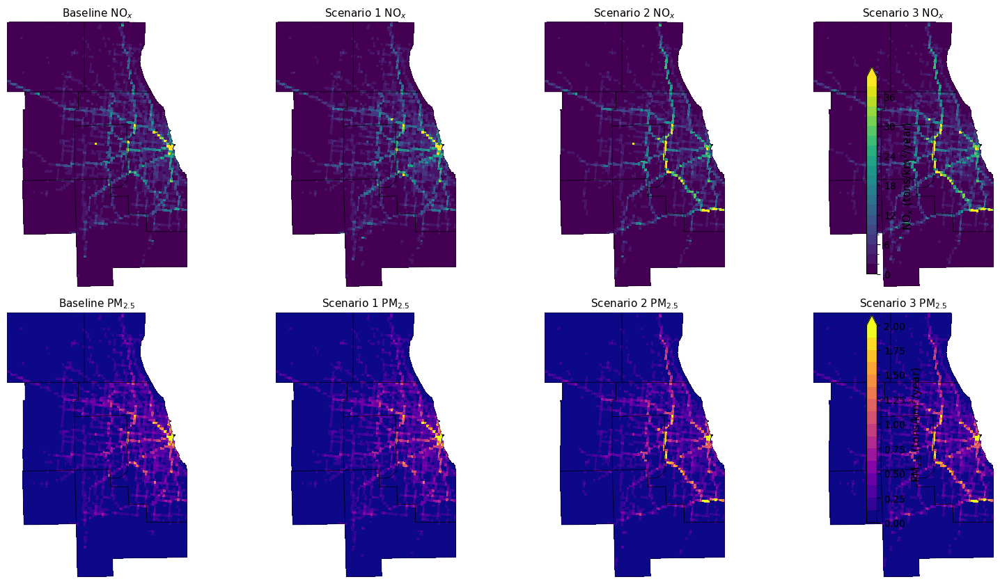

In [9]:
PM25_N_BINS   = 16
PM25_VMIN     = 0.0
PM25_VMAX     = 2.0
PM25_DIFF_MIN = -0.5
PM25_DIFF_MAX =  0.5

NOX_N_BINS   = 20
NOX_VMIN     = 0.0
NOX_VMAX     = 40.0
NOX_DIFF_MIN = -20.0
NOX_DIFF_MAX =  20.0

cmap_abs_pm = ListedColormap(plt.cm.plasma(np.linspace(0, 1, PM25_N_BINS)))
N_DIFF_PM = PM25_N_BINS if PM25_N_BINS % 2 == 1 else PM25_N_BINS + 1
cmap_diff_pm = ListedColormap(plt.cm.bwr(np.linspace(0, 1, N_DIFF_PM)))
norm_abs_pm = BoundaryNorm(np.linspace(PM25_VMIN, PM25_VMAX, PM25_N_BINS + 1), cmap_abs_pm.N)
norm_diff_pm = TwoSlopeNorm(vmin=PM25_DIFF_MIN, vcenter=0.0, vmax=PM25_DIFF_MAX)

cmap_abs_nox = ListedColormap(plt.cm.viridis(np.linspace(0, 1, NOX_N_BINS)))
N_DIFF_NOX = NOX_N_BINS if NOX_N_BINS % 2 == 1 else NOX_N_BINS + 1
cmap_diff_nox = ListedColormap(plt.cm.bwr(np.linspace(0, 1, N_DIFF_NOX)))
norm_abs_nox = BoundaryNorm(np.linspace(NOX_VMIN, NOX_VMAX, NOX_N_BINS + 1), cmap_abs_nox.N)
norm_diff_nox = TwoSlopeNorm(vmin=NOX_DIFF_MIN, vcenter=0.0, vmax=NOX_DIFF_MAX)


def _panel(ax, gdf, col, cmap, norm, vmin, vmax, title):
    gdf.plot(col, ax=ax, cmap=cmap, norm=norm, edgecolor="none", antialiased=False, vmin=vmin, vmax=vmax)
    cmap_cty.boundary.plot(ax=ax, color="k", alpha=0.5, linewidth=0.6)
    ax.set_title(title, fontsize=11)
    ax.set_extent(extent_xy, crs=ccrs.PlateCarree())
    ax.set_axis_off()


# ============================================================
# (i) ABSOLUTE FIGURE: 2 rows x 4 cols
# ============================================================
fig, axs = plt.subplots(
    nrows=2, ncols=4, figsize=(16, 8.5),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

# NOx top row
_panel(axs[0,0], onroad_total_base_cmap, "NOX_peryear", cmap_abs_nox, norm_abs_nox, NOX_VMIN, NOX_VMAX,
       "Baseline NO$_x$")
_panel(axs[0,1], onroad_total_LOCUSIdling_cmap, "NOX_peryear", cmap_abs_nox, norm_abs_nox, NOX_VMIN, NOX_VMAX,
       "Scenario 1 NO$_x$")
_panel(axs[0,2], onroad_total_HDVSpatial_cmap, "NOX_peryear", cmap_abs_nox, norm_abs_nox, NOX_VMIN, NOX_VMAX,
       "Scenario 2 NO$_x$")
_panel(axs[0,3], onroad_total_LOCUSIdlingHDVSpatial_cmap, "NOX_peryear", cmap_abs_nox, norm_abs_nox, NOX_VMIN, NOX_VMAX,
       "Scenario 3 NO$_x$")

# PM2.5 bottom row
_panel(axs[1,0], onroad_total_base_cmap, "PM25_peryear", cmap_abs_pm, norm_abs_pm, PM25_VMIN, PM25_VMAX,
       "Baseline PM$_{2.5}$")
_panel(axs[1,1], onroad_total_LOCUSIdling_cmap, "PM25_peryear", cmap_abs_pm, norm_abs_pm, PM25_VMIN, PM25_VMAX,
       "Scenario 1 PM$_{2.5}$")
_panel(axs[1,2], onroad_total_HDVSpatial_cmap, "PM25_peryear", cmap_abs_pm, norm_abs_pm, PM25_VMIN, PM25_VMAX,
       "Scenario 2 PM$_{2.5}$")
_panel(axs[1,3], onroad_total_LOCUSIdlingHDVSpatial_cmap, "PM25_peryear", cmap_abs_pm, norm_abs_pm, PM25_VMIN, PM25_VMAX,
       "Scenario 3 PM$_{2.5}$")

# Row colorbars
cb1 = fig.colorbar(plt.cm.ScalarMappable(norm=norm_abs_nox, cmap=cmap_abs_nox),
                   ax=axs[0,:].ravel().tolist(), fraction=0.03, pad=0.05, extend="max")
cb1.set_label("NO$_x$ (tons/km$^2$/year)", fontsize=11)

cb2 = fig.colorbar(plt.cm.ScalarMappable(norm=norm_abs_pm, cmap=cmap_abs_pm),
                   ax=axs[1,:].ravel().tolist(), fraction=0.03, pad=0.05, extend="max")
cb2.set_label("PM$_{2.5}$ (tons/km$^2$/year)", fontsize=11)

plt.tight_layout()
plt.show()

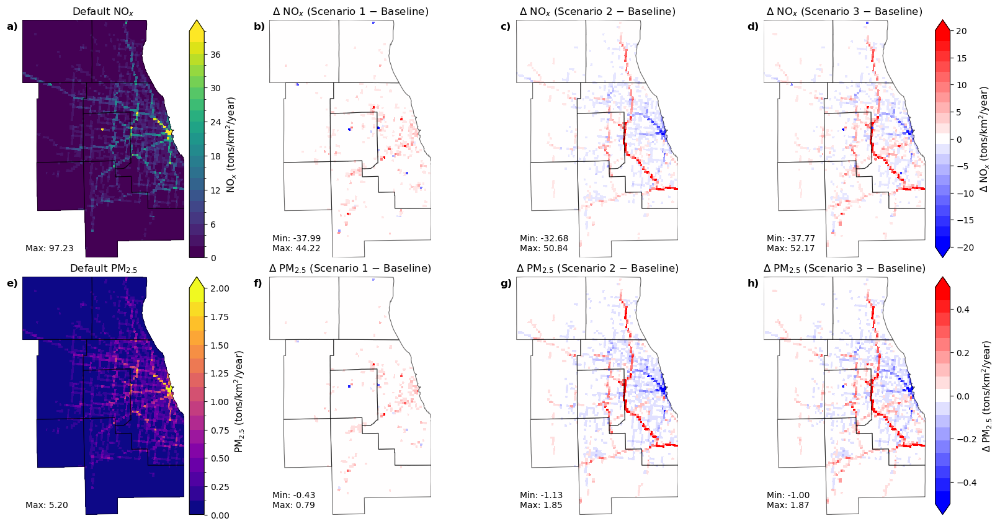

In [10]:
def annotate_max(ax, gdf, col, fmt="{:.2f}", color="black"):
    vals = gdf[col].astype(float).to_numpy()
    vals = vals[np.isfinite(vals)]
    vmax = float(np.max(vals)) if vals.size else np.nan
    ax.text(
        0.02, 0.02, f"Max: {fmt.format(vmax)}",
        transform=ax.transAxes, ha="left", va="bottom",
        fontsize=10, color=color,
        bbox=dict(facecolor="white", alpha=0.70, boxstyle="round,pad=0.25", linewidth=0)
    )
def annotate_panel_label(ax, label, loc="ul", fontsize=12):
    """
    Add subplot label like 'a)', 'b)' in axes coordinates.
    loc: 'ul' (upper-left) or 'ur' (upper-right)
    """
    if loc == "ul":
        x, y, ha, va = -0.1, 0.99, "left", "top"
    elif loc == "ur":
        x, y, ha, va = 0.98, 0.98, "right", "top"
    else:
        raise ValueError("loc must be 'ul' or 'ur'")

    ax.text(
        x, y, label,
        transform=ax.transAxes,
        ha=ha, va=va,
        fontsize=fontsize,
        fontweight="bold",
        bbox=dict(
            facecolor="white",
            alpha=0.85,
            boxstyle="round,pad=0.20",
            linewidth=0
        )
    )
def annotate_minmax(ax, gdf, col, fmt="{:.2f}", color="black"):
    vals = gdf[col].astype(float).to_numpy()
    vals = vals[np.isfinite(vals)]
    vmin = float(np.min(vals)) if vals.size else np.nan
    vmax = float(np.max(vals)) if vals.size else np.nan
    ax.text(
        0.02, 0.02, f"Min: {fmt.format(vmin)}\nMax: {fmt.format(vmax)}",
        transform=ax.transAxes, ha="left", va="bottom",
        fontsize=10, color=color,
        bbox=dict(facecolor="white", alpha=0.70, boxstyle="round,pad=0.25", linewidth=0)
    )

def _panel(ax, gdf, col, cmap, norm, vmin, vmax, title, ann="minmax", label=None):
    gdf.plot(
        col, ax=ax, cmap=cmap, norm=norm,
        edgecolor="none", antialiased=False,
        vmin=vmin, vmax=vmax
    )
    ax.set_title(title, fontsize=12)
    ax.set_extent(extent_xy, crs=ccrs.PlateCarree())
    cmap_cty.boundary.plot(ax=ax, color="k", alpha=0.6, linewidth=0.8)
    ax.set_axis_off()

    if ann == "max":
        annotate_max(ax, gdf, col, fmt="{:.2f}")
    else:
        annotate_minmax(ax, gdf, col, fmt="{:.2f}")

    if label is not None:
        annotate_panel_label(ax, label)
        
fig, axs = plt.subplots(
    nrows=2, ncols=4, figsize=(16, 8.5),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

# NOx top row
_panel(axs[0,0], onroad_total_base_cmap, "NOX_peryear",
       cmap_abs_nox, norm_abs_nox, NOX_VMIN, NOX_VMAX,
       "Default NO$_x$", ann="max", label="a)")

_panel(axs[0,1], onroad_total_LOCUSIdling_cmap, "diff_nox",
       cmap_diff_nox, norm_diff_nox, NOX_DIFF_MIN, NOX_DIFF_MAX,
       "Δ NO$_x$ (Scenario 1 − Baseline)", label="b)")

_panel(axs[0,2], onroad_total_HDVSpatial_cmap, "diff_nox",
       cmap_diff_nox, norm_diff_nox, NOX_DIFF_MIN, NOX_DIFF_MAX,
       "Δ NO$_x$ (Scenario 2 − Baseline)", label="c)")

_panel(axs[0,3], onroad_total_LOCUSIdlingHDVSpatial_cmap, "diff_nox",
       cmap_diff_nox, norm_diff_nox, NOX_DIFF_MIN, NOX_DIFF_MAX,
       "Δ NO$_x$ (Scenario 3 − Baseline)", label="d)")

# PM2.5 bottom row
_panel(axs[1,0], onroad_total_base_cmap, "PM25_peryear",
       cmap_abs_pm, norm_abs_pm, PM25_VMIN, PM25_VMAX,
       "Default PM$_{2.5}$", ann="max", label="e)")

_panel(axs[1,1], onroad_total_LOCUSIdling_cmap, "diff_pm25",
       cmap_diff_pm, norm_diff_pm, PM25_DIFF_MIN, PM25_DIFF_MAX,
       "Δ PM$_{2.5}$ (Scenario 1 − Baseline)", label="f)")

_panel(axs[1,2], onroad_total_HDVSpatial_cmap, "diff_pm25",
       cmap_diff_pm, norm_diff_pm, PM25_DIFF_MIN, PM25_DIFF_MAX,
       "Δ PM$_{2.5}$ (Scenario 2 − Baseline)", label="g)")

_panel(axs[1,3], onroad_total_LOCUSIdlingHDVSpatial_cmap, "diff_pm25",
       cmap_diff_pm, norm_diff_pm, PM25_DIFF_MIN, PM25_DIFF_MAX,
       "Δ PM$_{2.5}$ (Scenario 3 − Baseline)", label="h)")
# --- tighten + reserve right margin for colorbars
plt.tight_layout()
fig.subplots_adjust(wspace=0.06, hspace=0.08)

pos_col1_top = axs[0,0].get_position()
pos_col1_bot = axs[1,0].get_position()

pos_col4_top = axs[0,3].get_position()
pos_col4_bot = axs[1,3].get_position()
cax_abs_nox = fig.add_axes([
    pos_col1_top.x1 + 0.005,  # just right of column 1
    pos_col1_top.y0,
    0.015,
    pos_col1_top.height
])

cax_abs_pm = fig.add_axes([
    pos_col1_bot.x1 + 0.005,
    pos_col1_bot.y0,
    0.015,
    pos_col1_bot.height
])

# Difference colorbars — aligned with columns 2–4
cax_diff_nox = fig.add_axes([
    pos_col4_top.x1 + 0.010,  # right of column 4
    pos_col4_top.y0,
    0.015,
    pos_col4_top.height
])

cax_diff_pm = fig.add_axes([
    pos_col4_bot.x1 + 0.010,
    pos_col4_bot.y0,
    0.015,
    pos_col4_bot.height
])

# --------------------------------------------------
# Draw colorbars
# --------------------------------------------------
cb1 = fig.colorbar(
    plt.cm.ScalarMappable(norm=norm_abs_nox, cmap=cmap_abs_nox),
    cax=cax_abs_nox, extend="max"
)
cb1.set_label("NO$_x$ (tons/km$^2$/year)", fontsize=11)

cb1d = fig.colorbar(
    plt.cm.ScalarMappable(norm=norm_diff_nox, cmap=cmap_diff_nox),
    cax=cax_diff_nox, extend="both"
)
cb1d.set_label("Δ NO$_x$ (tons/km$^2$/year)", fontsize=11)

cb2 = fig.colorbar(
    plt.cm.ScalarMappable(norm=norm_abs_pm, cmap=cmap_abs_pm),
    cax=cax_abs_pm, extend="max"
)
cb2.set_label("PM$_{2.5}$ (tons/km$^2$/year)", fontsize=11)

cb2d = fig.colorbar(
    plt.cm.ScalarMappable(norm=norm_diff_pm, cmap=cmap_diff_pm),
    cax=cax_diff_pm, extend="both"
)
cb2d.set_label("Δ PM$_{2.5}$ (tons/km$^2$/year)", fontsize=11)

plt.show()

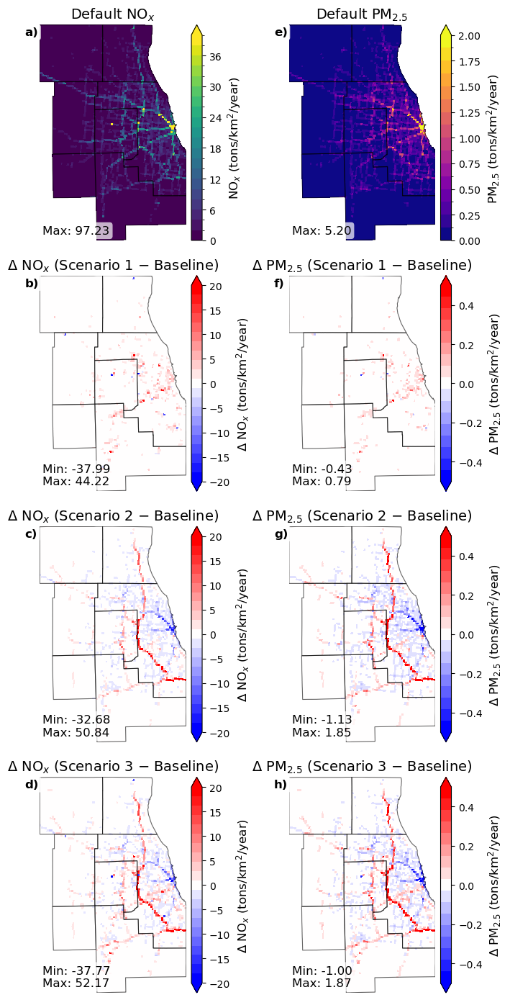

In [9]:
def annotate_max(ax, gdf, col, fmt="{:.2f}", color="black"):
    vals = gdf[col].astype(float).to_numpy()
    vals = vals[np.isfinite(vals)]
    vmax = float(np.max(vals)) if vals.size else np.nan
    ax.text(
        0.02, 0.02, f"Max: {fmt.format(vmax)}",
        transform=ax.transAxes, ha="left", va="bottom",
        fontsize=12, color=color,
        bbox=dict(facecolor="white", alpha=0.70, boxstyle="round,pad=0.25", linewidth=0)
    )

def annotate_minmax(ax, gdf, col, fmt="{:.2f}", color="black"):
    vals = gdf[col].astype(float).to_numpy()
    vals = vals[np.isfinite(vals)]
    vmin = float(np.min(vals)) if vals.size else np.nan
    vmax = float(np.max(vals)) if vals.size else np.nan
    ax.text(
        0.02, 0.02, f"Min: {fmt.format(vmin)}\nMax: {fmt.format(vmax)}",
        transform=ax.transAxes, ha="left", va="bottom",
        fontsize=12, color=color,
        bbox=dict(facecolor="white", alpha=0.70, boxstyle="round,pad=0.25", linewidth=0)
    )

def annotate_panel_label(ax, label, loc="ul", fontsize=12):
    if loc == "ul":
        x, y, ha, va = -0.1, 0.99, "left", "top"
    elif loc == "ur":
        x, y, ha, va = 0.98, 0.98, "right", "top"
    else:
        raise ValueError("loc must be 'ul' or 'ur'")

    ax.text(
        x, y, label,
        transform=ax.transAxes,
        ha=ha, va=va,
        fontsize=fontsize,
        fontweight="bold",
        bbox=dict(facecolor="white", alpha=0.85, boxstyle="round,pad=0.20", linewidth=0)
    )

# ----------------------------
# One panel (with its own colorbar)
# ----------------------------
def _panel(ax, gdf, col, cmap, norm, vmin, vmax, title, cbar_label,
           ann="minmax", label=None, cbar_extend="neither"):

    # Map
    gdf.plot(
        col, ax=ax, cmap=cmap, norm=norm,
        edgecolor="none", antialiased=False,
        vmin=vmin, vmax=vmax
    )

    # Formatting
    ax.set_title(title, fontsize=14)
    ax.set_extent(extent_xy, crs=ccrs.PlateCarree())
    cmap_cty.boundary.plot(ax=ax, color="k", alpha=0.6, linewidth=0.8)
    ax.set_axis_off()

    # Annotations
    if ann == "max":
        annotate_max(ax, gdf, col, fmt="{:.2f}")
    else:
        annotate_minmax(ax, gdf, col, fmt="{:.2f}")

    if label is not None:
        annotate_panel_label(ax, label)

    # Individual colorbar (per panel) with configurable extend
    sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, fraction=0.046, pad=0.02, extend=cbar_extend)
    cbar.set_label(cbar_label, fontsize=12)

# ============================================================
# Figure: 4 rows x 2 cols
# Left column = NOx
# Right column = PM2.5
# Row 1 = Baseline (extend="max")
# Rows 2–4 = Scenario − Baseline (extend="both")
# Labels: a,b,c,d on NOx; e,f,g,h on PM2.5
# ============================================================
fig, axs = plt.subplots(
    nrows=4, ncols=2, figsize=(8, 14),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

# -------------------------
# Row 1: Baseline (extend="max")
# -------------------------
_panel(
    axs[0, 0], onroad_total_base_cmap, "NOX_peryear",
    cmap_abs_nox, norm_abs_nox, NOX_VMIN, NOX_VMAX,
    "Default NO$_x$", "NO$_x$ (tons/km$^2$/year)",
    ann="max", label="a)", cbar_extend="max"
)

_panel(
    axs[0, 1], onroad_total_base_cmap, "PM25_peryear",
    cmap_abs_pm, norm_abs_pm, PM25_VMIN, PM25_VMAX,
    "Default PM$_{2.5}$", "PM$_{2.5}$ (tons/km$^2$/year)",
    ann="max", label="e)", cbar_extend="max"
)

# -------------------------
# Row 2: Scenario 1 − Baseline (extend="both")
# -------------------------
_panel(
    axs[1, 0], onroad_total_LOCUSIdling_cmap, "diff_nox",
    cmap_diff_nox, norm_diff_nox, NOX_DIFF_MIN, NOX_DIFF_MAX,
    "Δ NO$_x$ (Scenario 1 − Baseline)", "Δ NO$_x$ (tons/km$^2$/year)",
    ann="minmax", label="b)", cbar_extend="both"
)

_panel(
    axs[1, 1], onroad_total_LOCUSIdling_cmap, "diff_pm25",
    cmap_diff_pm, norm_diff_pm, PM25_DIFF_MIN, PM25_DIFF_MAX,
    "Δ PM$_{2.5}$ (Scenario 1 − Baseline)", "Δ PM$_{2.5}$ (tons/km$^2$/year)",
    ann="minmax", label="f)", cbar_extend="both"
)

# -------------------------
# Row 3: Scenario 2 − Baseline (extend="both")
# -------------------------
_panel(
    axs[2, 0], onroad_total_HDVSpatial_cmap, "diff_nox",
    cmap_diff_nox, norm_diff_nox, NOX_DIFF_MIN, NOX_DIFF_MAX,
    "Δ NO$_x$ (Scenario 2 − Baseline)", "Δ NO$_x$ (tons/km$^2$/year)",
    ann="minmax", label="c)", cbar_extend="both"
)

_panel(
    axs[2, 1], onroad_total_HDVSpatial_cmap, "diff_pm25",
    cmap_diff_pm, norm_diff_pm, PM25_DIFF_MIN, PM25_DIFF_MAX,
    "Δ PM$_{2.5}$ (Scenario 2 − Baseline)", "Δ PM$_{2.5}$ (tons/km$^2$/year)",
    ann="minmax", label="g)", cbar_extend="both"
)

# -------------------------
# Row 4: Scenario 3 − Baseline (extend="both")
# -------------------------
_panel(
    axs[3, 0], onroad_total_LOCUSIdlingHDVSpatial_cmap, "diff_nox",
    cmap_diff_nox, norm_diff_nox, NOX_DIFF_MIN, NOX_DIFF_MAX,
    "Δ NO$_x$ (Scenario 3 − Baseline)", "Δ NO$_x$ (tons/km$^2$/year)",
    ann="minmax", label="d)", cbar_extend="both"
)

_panel(
    axs[3, 1], onroad_total_LOCUSIdlingHDVSpatial_cmap, "diff_pm25",
    cmap_diff_pm, norm_diff_pm, PM25_DIFF_MIN, PM25_DIFF_MAX,
    "Δ PM$_{2.5}$ (Scenario 3 − Baseline)", "Δ PM$_{2.5}$ (tons/km$^2$/year)",
    ann="minmax", label="h)", cbar_extend="both"
)

plt.tight_layout()
plt.show()

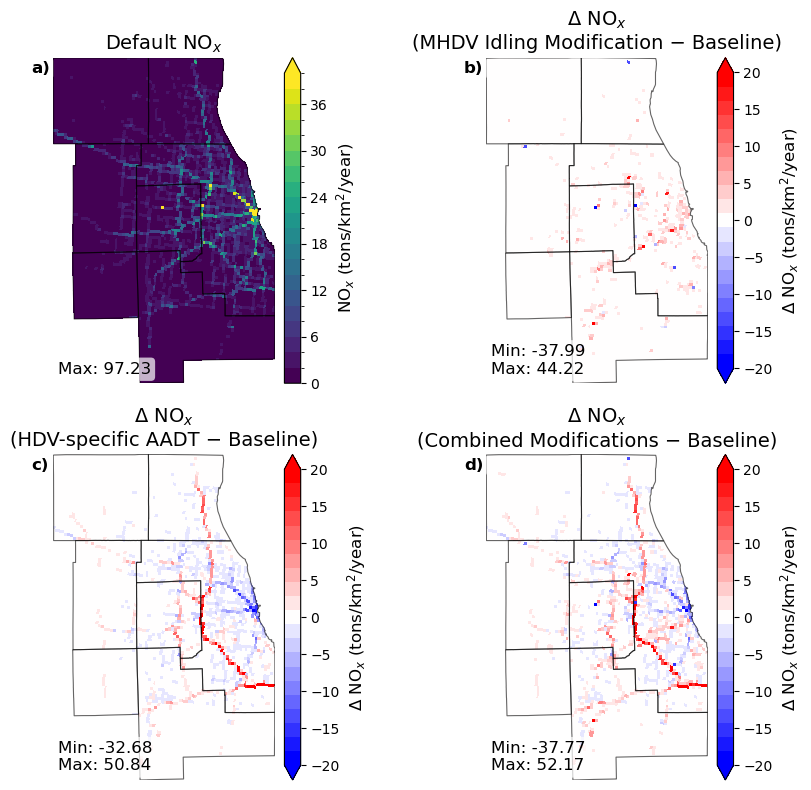

In [13]:
# ============================================================
# Figure: 2 rows x 2 cols, NOx only
# Row 1 = Baseline, Scenario 1 − Baseline
# Row 2 = Scenario 2 − Baseline, Scenario 3 − Baseline
# ============================================================
fig, axs = plt.subplots(
    nrows=2, ncols=2, figsize=(10, 8),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

# -------------------------
# Panel a: Baseline
# -------------------------
_panel(
    axs[0, 0], onroad_total_base_cmap, "NOX_peryear",
    cmap_abs_nox, norm_abs_nox, NOX_VMIN, NOX_VMAX,
    "Default NO$_x$", "NO$_x$ (tons/km$^2$/year)",
    ann="max", label="a)", cbar_extend="max"
)

# -------------------------
# Panel b: Scenario 1 − Baseline
# -------------------------
_panel(
    axs[0, 1], onroad_total_LOCUSIdling_cmap, "diff_nox",
    cmap_diff_nox, norm_diff_nox, NOX_DIFF_MIN, NOX_DIFF_MAX,
    "Δ NO$_x$\n(MHDV Idling Modification − Baseline)", "Δ NO$_x$ (tons/km$^2$/year)",
    ann="minmax", label="b)", cbar_extend="both"
)

# -------------------------
# Panel c: Scenario 2 − Baseline
# -------------------------
_panel(
    axs[1, 0], onroad_total_HDVSpatial_cmap, "diff_nox",
    cmap_diff_nox, norm_diff_nox, NOX_DIFF_MIN, NOX_DIFF_MAX,
    "Δ NO$_x$\n(HDV-specific AADT − Baseline)", "Δ NO$_x$ (tons/km$^2$/year)",
    ann="minmax", label="c)", cbar_extend="both"
)

# -------------------------
# Panel d: Scenario 3 − Baseline
# -------------------------
_panel(
    axs[1, 1], onroad_total_LOCUSIdlingHDVSpatial_cmap, "diff_nox",
    cmap_diff_nox, norm_diff_nox, NOX_DIFF_MIN, NOX_DIFF_MAX,
    "Δ NO$_x$\n(Combined Modifications − Baseline)", "Δ NO$_x$ (tons/km$^2$/year)",
    ann="minmax", label="d)", cbar_extend="both"
)

plt.tight_layout()
plt.show()

In [2]:
def total_tons_per_year_from_density(gdf, density_col, area_crs="EPSG:6933"):
    """
    density_col is in tons/km^2/year.
    Returns total tons/year by multiplying by polygon area (km^2) and summing.
    """
    if density_col not in gdf.columns:
        raise KeyError(f"Missing column '{density_col}'")

    # compute polygon areas in km^2 using an equal-area CRS
    g_area = gdf.to_crs(area_crs).copy()
    area_km2 = g_area.geometry.area.to_numpy(dtype=float) / 1e6  

    vals = gdf[density_col].to_numpy(dtype=float)
    m = np.isfinite(vals) & np.isfinite(area_km2)

    return float(np.sum(vals[m] * area_km2[m]))

gas_base_cmap = gpd.clip(gas_base, cmap_cty)
diesel_base_cmap = gpd.clip(diesel_base, cmap_cty)

# If you want totals over the FULL shapefile domain instead, use:
# gas_base_cmap = gas_base.copy()
# diesel_base_cmap = diesel_base.copy()

# Calculate NOx + PM2.5 per area per year (tons/km^2/year)
gas_base_cmap = calc_nox_peryear(gas_base_cmap)
diesel_base_cmap = calc_nox_peryear(diesel_base_cmap)

gas_base_cmap = calc_pm25_peryear(gas_base_cmap)
diesel_base_cmap = calc_pm25_peryear(diesel_base_cmap)

# Integrate to totals (tons/year)
gas_nox_total_tpy    = total_tons_per_year_from_density(gas_base_cmap, "NOX_peryear")
diesel_nox_total_tpy = total_tons_per_year_from_density(diesel_base_cmap, "NOX_peryear")

gas_pm25_total_tpy    = total_tons_per_year_from_density(gas_base_cmap, "PM25_peryear")
diesel_pm25_total_tpy = total_tons_per_year_from_density(diesel_base_cmap, "PM25_peryear")

print("=== Baseline totals (tons/year) ===")
print(f"NOx  | Gas:    {gas_nox_total_tpy:,.2f} | Diesel: {diesel_nox_total_tpy:,.2f} | Total: {(gas_nox_total_tpy + diesel_nox_total_tpy):,.2f}")
print(f"PM2.5| Gas:    {gas_pm25_total_tpy:,.2f} | Diesel: {diesel_pm25_total_tpy:,.2f} | Total: {(gas_pm25_total_tpy + diesel_pm25_total_tpy):,.2f}")

# ----------------------------
# Percent contribution by fuel
# ----------------------------
nox_total = gas_nox_total_tpy + diesel_nox_total_tpy
pm25_total = gas_pm25_total_tpy + diesel_pm25_total_tpy

gas_nox_pct = 100 * gas_nox_total_tpy / nox_total if nox_total != 0 else np.nan
diesel_nox_pct = 100 * diesel_nox_total_tpy / nox_total if nox_total != 0 else np.nan

gas_pm25_pct = 100 * gas_pm25_total_tpy / pm25_total if pm25_total != 0 else np.nan
diesel_pm25_pct = 100 * diesel_pm25_total_tpy / pm25_total if pm25_total != 0 else np.nan

print("=== Baseline totals (%) ===")
print(f"NOx  | Gas: {gas_nox_pct:.1f}% | Diesel: {diesel_nox_pct:.1f}%")
print(f"PM2.5| Gas: {gas_pm25_pct:.1f}% | Diesel: {diesel_pm25_pct:.1f}%")

NameError: name 'gpd' is not defined

<h1> Plot the data 

In [1]:
onroad_total_base_cmap.columns

NameError: name 'onroad_total_base_cmap' is not defined

Columns being plotted:
ACET
ACROLEIN
ALD2
ALD2_PRIMA
ALDX
APIN
BENZ
BUTADIENE1
CH4
CH4_INV
CO
CO2_INV
ETH
ETHA
ETHY
ETHYLBENZ
ETOH
FORM
FORM_PRIMA
GLY
HONO
IOLE
ISOP
IVOC
KET
MEOH
N2O_INV
NAPH
NH3
NMOG
NO
NO2
NVOL
OLE
PAL
PAR
PCA
PCL
PEC
PFE
PH2O
PK
PMC
PMG
PMN
PMOTHR
PNA
PNCOM
PNH4
PNO3
POC
PRPA
PSI
PSO4
PTI
SO2
SOAALK
TERP
TOL
UNR
VOC_INV
XYLMN
NOX_peryear
PM25_peryear


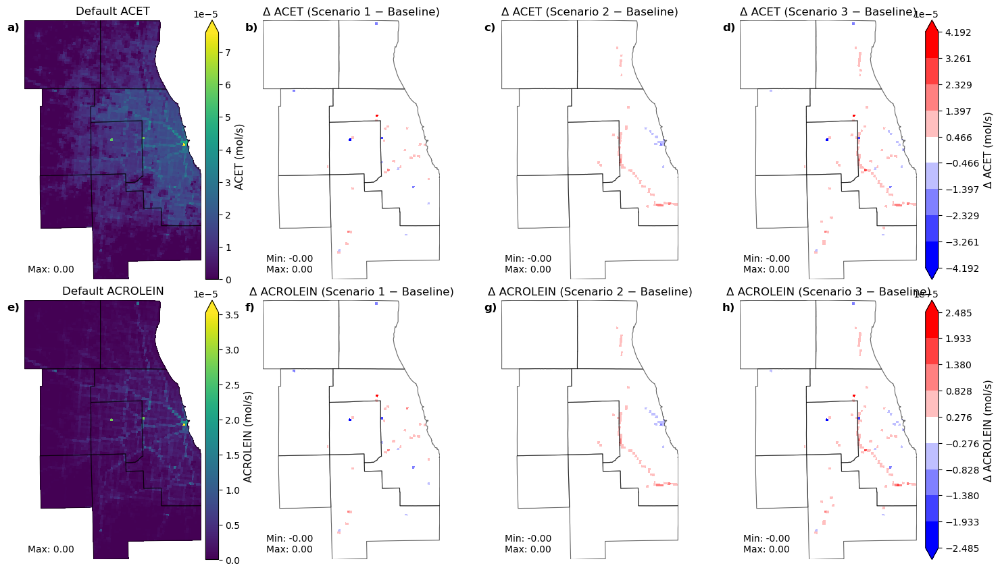

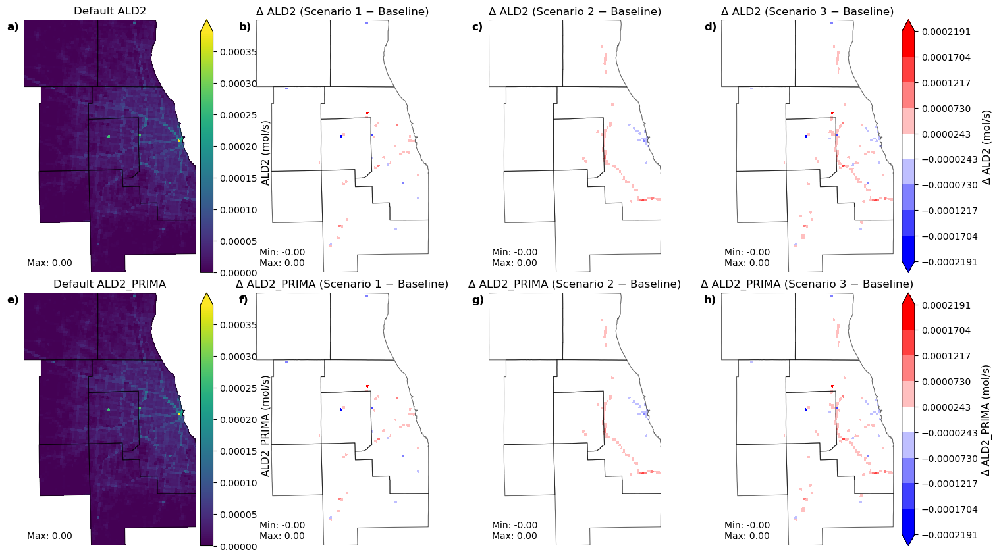

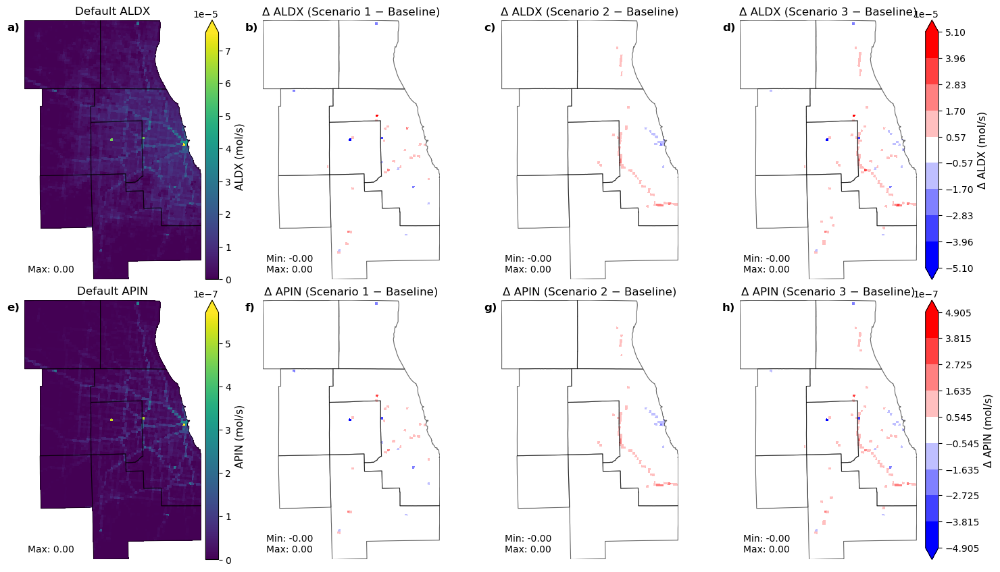

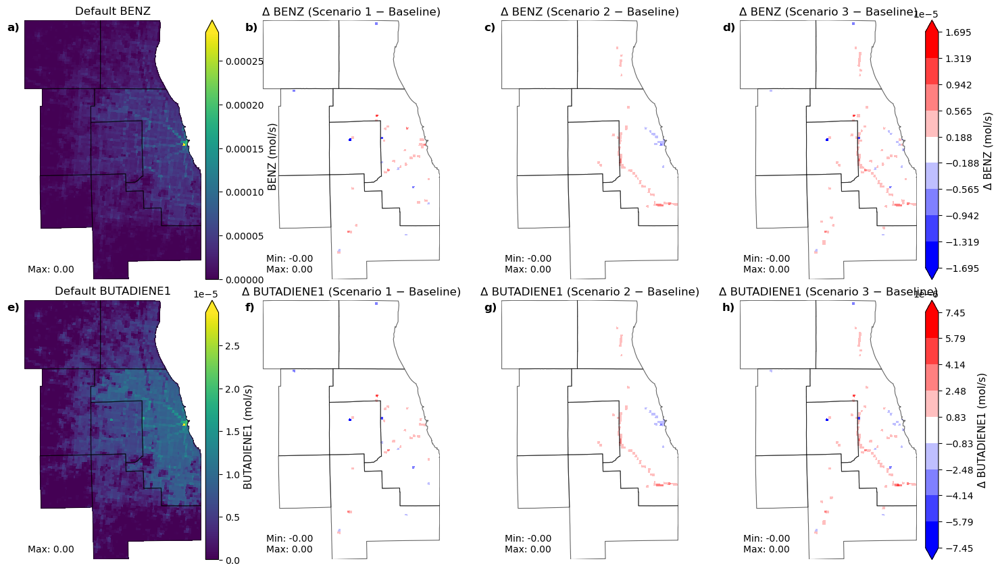

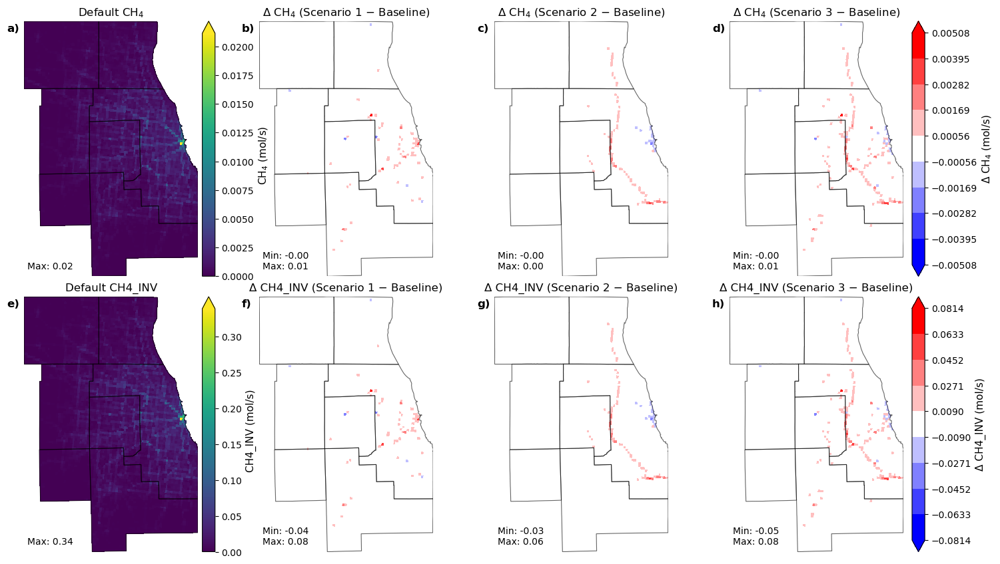

...

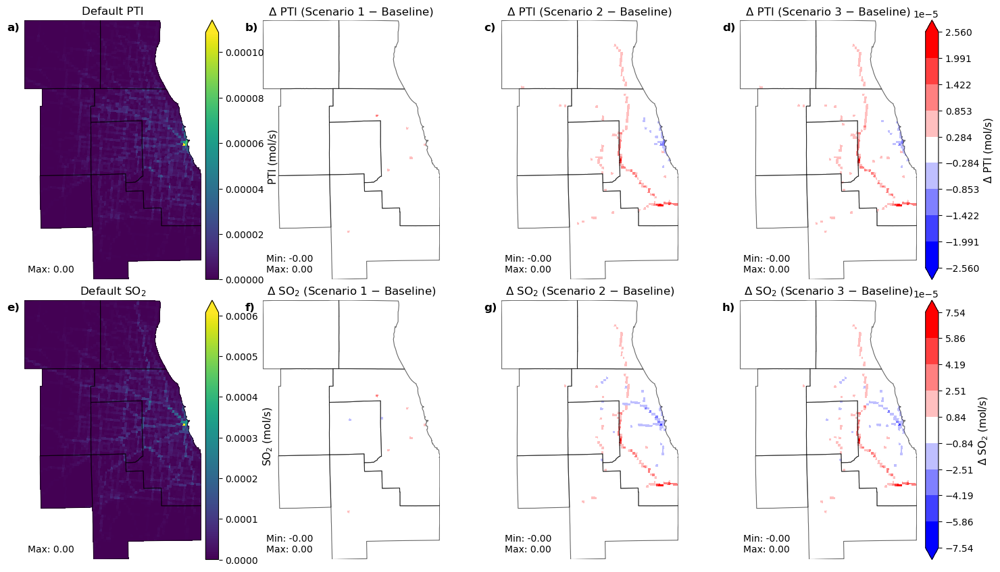

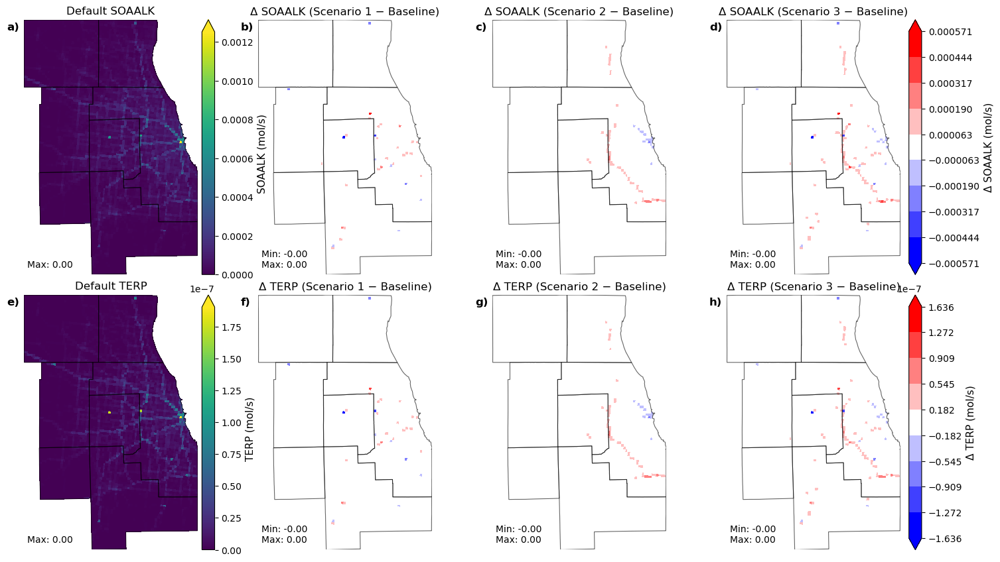

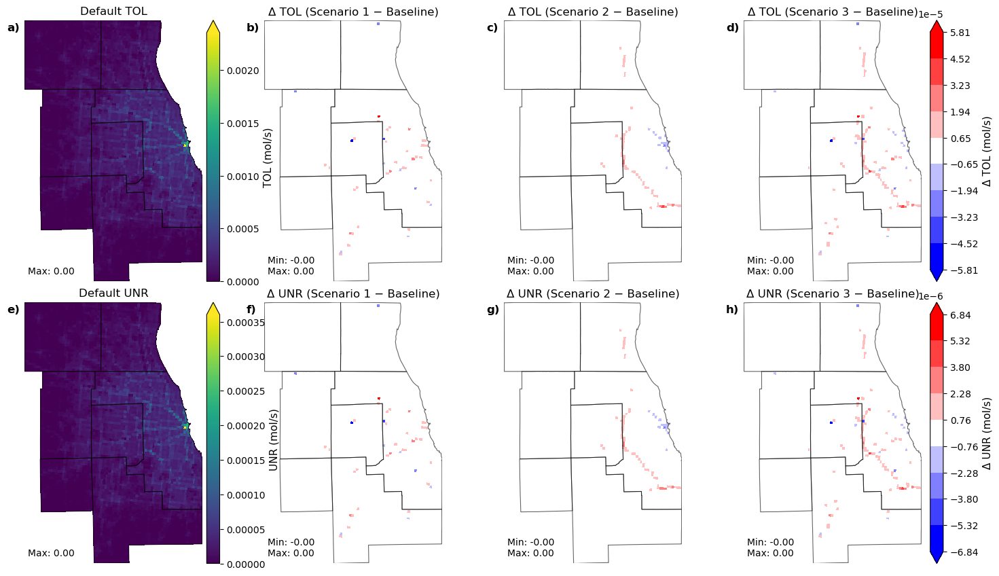

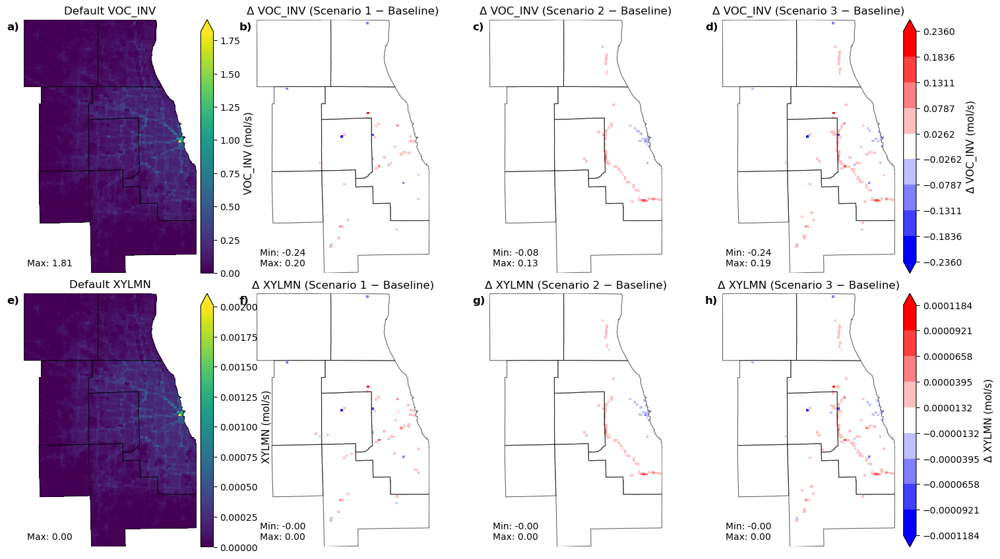

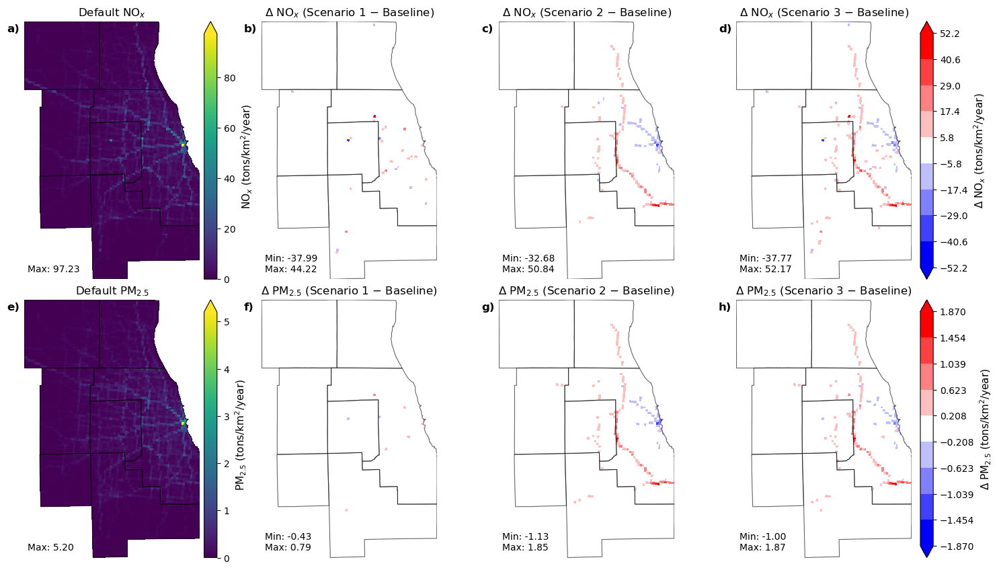

Done. All figures saved to: All_Onroad_Columns_Figures


In [17]:
import os
import string
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs

# ============================================================
# OUTPUT DIRECTORY
# ============================================================
outdir = "All_Onroad_Columns_Figures"
os.makedirs(outdir, exist_ok=True)

# ============================================================
# OPTIONAL: EXCLUDE NON-SPECIES / HELPER COLUMNS
# ============================================================
exclude_cols = {
    "lat", "lon", "lat_m", "lon_m", "geometry"
}

# ============================================================
# HELPER FUNCTIONS
# ============================================================
def annotate_max(ax, vals, fmt="{:.2f}", color="black"):
    vals = np.asarray(vals, dtype=float)
    vals = vals[np.isfinite(vals)]
    vmax = float(np.max(vals)) if vals.size else np.nan
    ax.text(
        0.02, 0.02, f"Max: {fmt.format(vmax)}",
        transform=ax.transAxes, ha="left", va="bottom",
        fontsize=10, color=color,
        bbox=dict(facecolor="white", alpha=0.70, boxstyle="round,pad=0.25", linewidth=0)
    )

def annotate_minmax(ax, vals, fmt="{:.2f}", color="black"):
    vals = np.asarray(vals, dtype=float)
    vals = vals[np.isfinite(vals)]
    vmin = float(np.min(vals)) if vals.size else np.nan
    vmax = float(np.max(vals)) if vals.size else np.nan
    ax.text(
        0.02, 0.02, f"Min: {fmt.format(vmin)}\nMax: {fmt.format(vmax)}",
        transform=ax.transAxes, ha="left", va="bottom",
        fontsize=10, color=color,
        bbox=dict(facecolor="white", alpha=0.70, boxstyle="round,pad=0.25", linewidth=0)
    )

def annotate_panel_label(ax, label, loc="ul", fontsize=12):
    if loc == "ul":
        x, y, ha, va = -0.1, 0.99, "left", "top"
    elif loc == "ur":
        x, y, ha, va = 0.98, 0.98, "right", "top"
    else:
        raise ValueError("loc must be 'ul' or 'ur'")

    ax.text(
        x, y, label,
        transform=ax.transAxes,
        ha=ha, va=va,
        fontsize=fontsize,
        fontweight="bold",
        bbox=dict(
            facecolor="white",
            alpha=0.85,
            boxstyle="round,pad=0.20",
            linewidth=0
        )
    )

def make_discrete_diff_cmap_and_norm(vmin, vmax, n_bins=9, cmap_name="bwr"):
    bounds = np.linspace(vmin, vmax, n_bins + 1)
    cmap = plt.get_cmap(cmap_name, n_bins)
    norm = mcolors.BoundaryNorm(bounds, cmap.N, clip=True)
    return cmap, norm, bounds

def nice_label(col):
    mapping = {
        "NOX_peryear": "NO$_x$",
        "PM25_peryear": "PM$_{2.5}$",
        "SO2": "SO$_2$",
        "NH3": "NH$_3$",
        "NO2": "NO$_2$",
        "CH4": "CH$_4$",
        "HONO": "HONO",
        "PEC": "PEC",
        "POC": "POC",
        "PNH4": "PNH$_4$",
        "PNO3": "PNO$_3$",
        "PSO4": "PSO$_4$",
        "PMC": "PMC",
        "CO2_INV": "CO$_2$",
        "N2O_INV": "N$_2$O",
    }
    return mapping.get(col, col)

def units_label(col):
    if col.endswith("_peryear"):
        return "tons/km$^2$/year"
    else:
        return "mol/s"

def plot_gdf_column(ax, gdf, col, cmap, norm, vmin, vmax, title, ann="minmax", label=None):
    gdf.plot(
        column=col,
        ax=ax,
        cmap=cmap,
        norm=norm,
        edgecolor="none",
        antialiased=False,
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(title, fontsize=12)
    ax.set_extent(extent_xy, crs=ccrs.PlateCarree())
    cmap_cty.boundary.plot(ax=ax, color="k", alpha=0.6, linewidth=0.8)
    ax.set_axis_off()

    vals = gdf[col].astype(float).to_numpy()
    if ann == "max":
        annotate_max(ax, vals, fmt="{:.2f}")
    else:
        annotate_minmax(ax, vals, fmt="{:.2f}")

    if label is not None:
        annotate_panel_label(ax, label)

def plot_array_panel(ax, template_gdf, arr, cmap, norm, vmin, vmax, title, ann="minmax", label=None):
    temp = template_gdf.copy()
    temp["_plotcol_"] = arr

    temp.plot(
        column="_plotcol_",
        ax=ax,
        cmap=cmap,
        norm=norm,
        edgecolor="none",
        antialiased=False,
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(title, fontsize=12)
    ax.set_extent(extent_xy, crs=ccrs.PlateCarree())
    cmap_cty.boundary.plot(ax=ax, color="k", alpha=0.6, linewidth=0.8)
    ax.set_axis_off()

    if ann == "max":
        annotate_max(ax, arr, fmt="{:.2f}")
    else:
        annotate_minmax(ax, arr, fmt="{:.2f}")

    if label is not None:
        annotate_panel_label(ax, label)

# ============================================================
# FIND ALL NUMERIC COLUMNS TO PLOT
# ============================================================
all_vars = []

for col in onroad_total_base_cmap.columns:
    if col in exclude_cols:
        continue

    if not np.issubdtype(onroad_total_base_cmap[col].dtype, np.number):
        continue

    if col not in onroad_total_LOCUSIdling_cmap.columns:
        continue
    if col not in onroad_total_HDVSpatial_cmap.columns:
        continue
    if col not in onroad_total_LOCUSIdlingHDVSpatial_cmap.columns:
        continue

    all_vars.append(col)

print("Columns being plotted:")
for col in all_vars:
    print(col)

# ============================================================
# PLOT TWO VARIABLES PER FIGURE (2 ROWS x 4 COLS)
# ============================================================
for fig_idx in range(0, len(all_vars), 2):

    pair = all_vars[fig_idx:fig_idx+2]

    if len(pair) == 1:
        pair.append(None)

    fig, axs = plt.subplots(
        nrows=2, ncols=4, figsize=(16, 8.5),
        subplot_kw={"projection": ccrs.PlateCarree()}
    )

    panel_letters = list(string.ascii_lowercase)
    row_colorbar_info = []

    for row_i, col in enumerate(pair):

        if col is None:
            for j in range(4):
                axs[row_i, j].set_axis_off()
            continue

        species_label = nice_label(col)
        species_units = units_label(col)

        # --------------------------------------------------
        # BASELINE VALUES
        # --------------------------------------------------
        base_vals = onroad_total_base_cmap[col].astype(float).to_numpy()
        base_vals = base_vals[np.isfinite(base_vals)]

        ABS_VMIN = float(np.min(base_vals)) if base_vals.size else 0.0
        ABS_VMAX = float(np.max(base_vals)) if base_vals.size else 1.0

        if ABS_VMIN == ABS_VMAX:
            ABS_VMAX = ABS_VMIN + 1e-12

        cmap_abs = plt.cm.viridis
        norm_abs = mcolors.Normalize(vmin=ABS_VMIN, vmax=ABS_VMAX)

        # --------------------------------------------------
        # DIFFERENCES COMPUTED ON THE FLY
        # --------------------------------------------------
        diff1 = (
            onroad_total_LOCUSIdling_cmap[col].astype(float).to_numpy()
            - onroad_total_base_cmap[col].astype(float).to_numpy()
        )
        diff2 = (
            onroad_total_HDVSpatial_cmap[col].astype(float).to_numpy()
            - onroad_total_base_cmap[col].astype(float).to_numpy()
        )
        diff3 = (
            onroad_total_LOCUSIdlingHDVSpatial_cmap[col].astype(float).to_numpy()
            - onroad_total_base_cmap[col].astype(float).to_numpy()
        )

        all_diff = np.concatenate([diff1, diff2, diff3])
        all_diff = all_diff[np.isfinite(all_diff)]

        if all_diff.size == 0:
            DIFF_MAX = 1.0
        else:
            DIFF_MAX = float(np.max(np.abs(all_diff)))
            if DIFF_MAX == 0:
                DIFF_MAX = 1.0

        DIFF_MIN = -DIFF_MAX

        cmap_diff, norm_diff, diff_bounds = make_discrete_diff_cmap_and_norm(
            DIFF_MIN, DIFF_MAX, n_bins=9, cmap_name="bwr"
        )

        # --------------------------------------------------
        # PANEL LABELS
        # --------------------------------------------------
        letter_base = panel_letters[row_i * 4 + 0] + ")"
        letter_s1   = panel_letters[row_i * 4 + 1] + ")"
        letter_s2   = panel_letters[row_i * 4 + 2] + ")"
        letter_s3   = panel_letters[row_i * 4 + 3] + ")"

        # --------------------------------------------------
        # BASELINE PANEL
        # --------------------------------------------------
        plot_gdf_column(
            axs[row_i, 0],
            onroad_total_base_cmap,
            col,
            cmap_abs,
            norm_abs,
            ABS_VMIN,
            ABS_VMAX,
            f"Default {species_label}",
            ann="max",
            label=letter_base
        )

        # --------------------------------------------------
        # DIFFERENCE PANELS
        # --------------------------------------------------
        plot_array_panel(
            axs[row_i, 1],
            onroad_total_base_cmap,
            diff1,
            cmap_diff,
            norm_diff,
            DIFF_MIN,
            DIFF_MAX,
            f"Δ {species_label} (Scenario 1 − Baseline)",
            ann="minmax",
            label=letter_s1
        )

        plot_array_panel(
            axs[row_i, 2],
            onroad_total_base_cmap,
            diff2,
            cmap_diff,
            norm_diff,
            DIFF_MIN,
            DIFF_MAX,
            f"Δ {species_label} (Scenario 2 − Baseline)",
            ann="minmax",
            label=letter_s2
        )

        plot_array_panel(
            axs[row_i, 3],
            onroad_total_base_cmap,
            diff3,
            cmap_diff,
            norm_diff,
            DIFF_MIN,
            DIFF_MAX,
            f"Δ {species_label} (Scenario 3 − Baseline)",
            ann="minmax",
            label=letter_s3
        )

        row_colorbar_info.append({
            "row_i": row_i,
            "species_label": species_label,
            "species_units": species_units,
            "norm_abs": norm_abs,
            "cmap_abs": cmap_abs,
            "norm_diff": norm_diff,
            "cmap_diff": cmap_diff,
            "diff_bounds": diff_bounds
        })

    # ------------------------------------------------------
    # LAYOUT FIRST
    # ------------------------------------------------------
    plt.tight_layout()
    fig.subplots_adjust(left=0.03, right=0.90, wspace=0.06, hspace=0.08)

    # force final positions to update before adding colorbars
    fig.canvas.draw()

    # ------------------------------------------------------
    # NOW ADD COLORBARS AFTER LAYOUT IS FINAL
    # ------------------------------------------------------
    for info in row_colorbar_info:
        row_i = info["row_i"]

        pos_col1 = axs[row_i, 0].get_position()
        pos_col4 = axs[row_i, 3].get_position()

        cax_abs = fig.add_axes([
            pos_col1.x1 + 0.004,
            pos_col1.y0,
            0.012,
            pos_col1.height
        ])

        cax_diff = fig.add_axes([
            pos_col4.x1 + 0.008,
            pos_col4.y0,
            0.012,
            pos_col4.height
        ])

        cb_abs = fig.colorbar(
            plt.cm.ScalarMappable(norm=info["norm_abs"], cmap=info["cmap_abs"]),
            cax=cax_abs,
            extend="max"
        )
        cb_abs.set_label(
            f"{info['species_label']} ({info['species_units']})",
            fontsize=11
        )

        cb_diff = fig.colorbar(
            plt.cm.ScalarMappable(norm=info["norm_diff"], cmap=info["cmap_diff"]),
            cax=cax_diff,
            boundaries=info["diff_bounds"],
            ticks=info["diff_bounds"],
            spacing="proportional",
            extend="both"
        )
        cb_diff.set_label(
            f"Δ {info['species_label']} ({info['species_units']})",
            fontsize=11
        )

    # ------------------------------------------------------
    # SAVE FIGURE
    # ------------------------------------------------------
    start_var = pair[0] if pair[0] is not None else "NA"
    end_var   = pair[1] if pair[1] is not None else "NA"

    fname = f"{fig_idx//2 + 1:02d}_{start_var}_to_{end_var}.png"
    fpath = os.path.join(outdir, fname)

    plt.savefig(fpath, dpi=300, bbox_inches="tight")
    plt.show()
    plt.close(fig)

print(f"Done. All figures saved to: {outdir}")

Full-domain plotting extent: [-90.13451782226562, -84.45715698242188, 40.172603149414066, 44.08426330566406]
Columns being plotted:
ACET
ACROLEIN
ALD2
ALD2_PRIMA
ALDX
APIN
BENZ
BUTADIENE1
CH4
CH4_INV
CO
CO2_INV
ETH
ETHA
ETHY
ETHYLBENZ
ETOH
FORM
FORM_PRIMA
GLY
HONO
IOLE
ISOP
IVOC
KET
MEOH
N2O_INV
NAPH
NH3
NMOG
NO
NO2
NVOL
OLE
PAL
PAR
PCA
PCL
PEC
PFE
PH2O
PK
PMC
PMG
PMN
PMOTHR
PNA
PNCOM
PNH4
PNO3
POC
PRPA
PSI
PSO4
PTI
SO2
SOAALK
TERP
TOL
UNR
VOC_INV
XYLMN


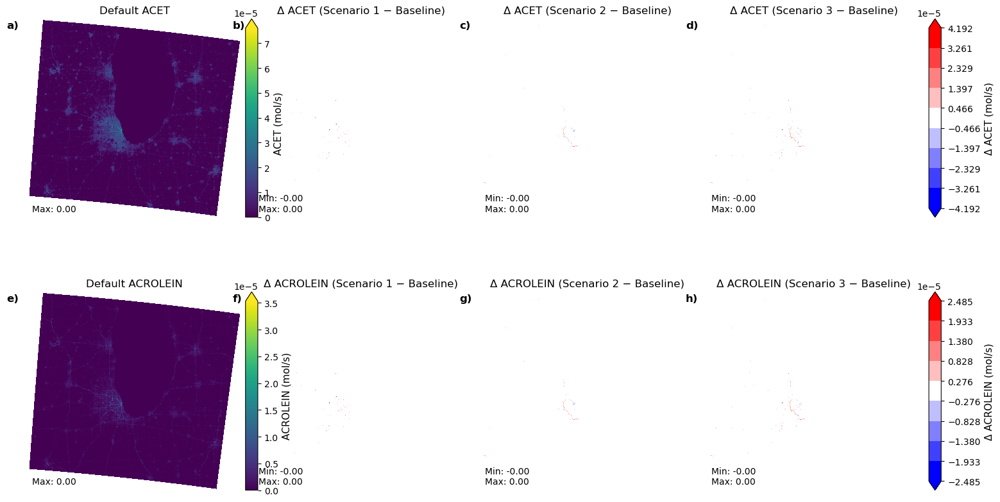

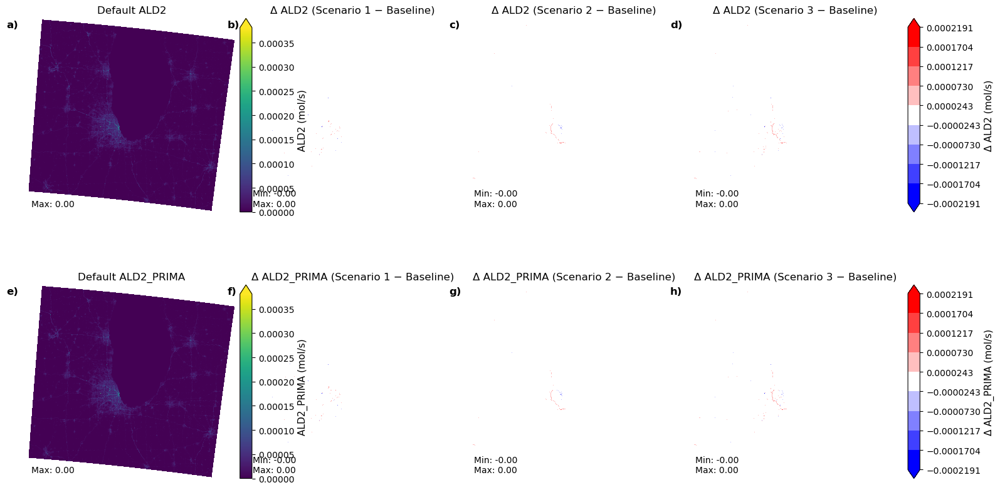

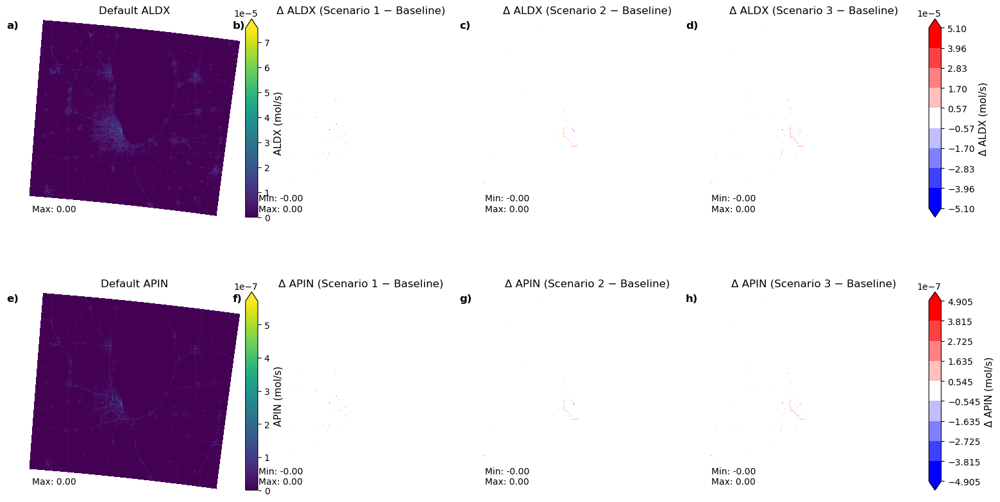

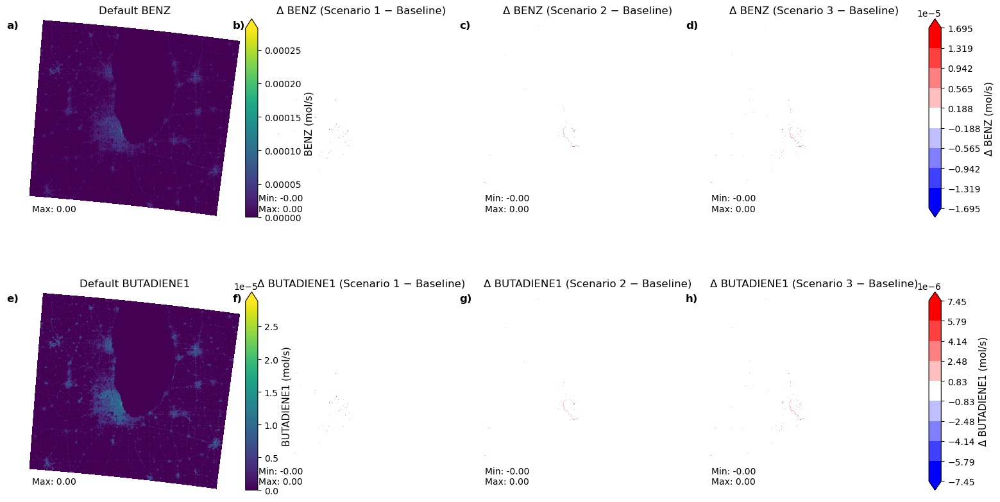

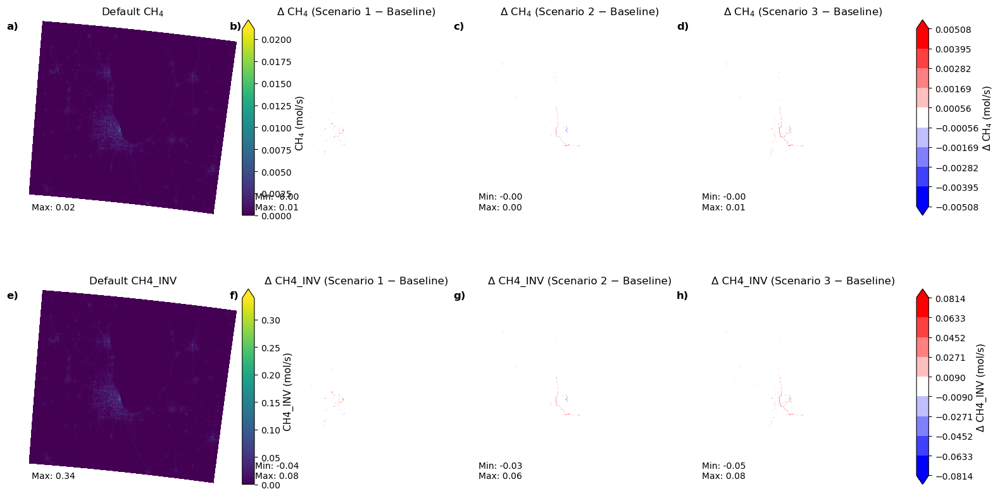

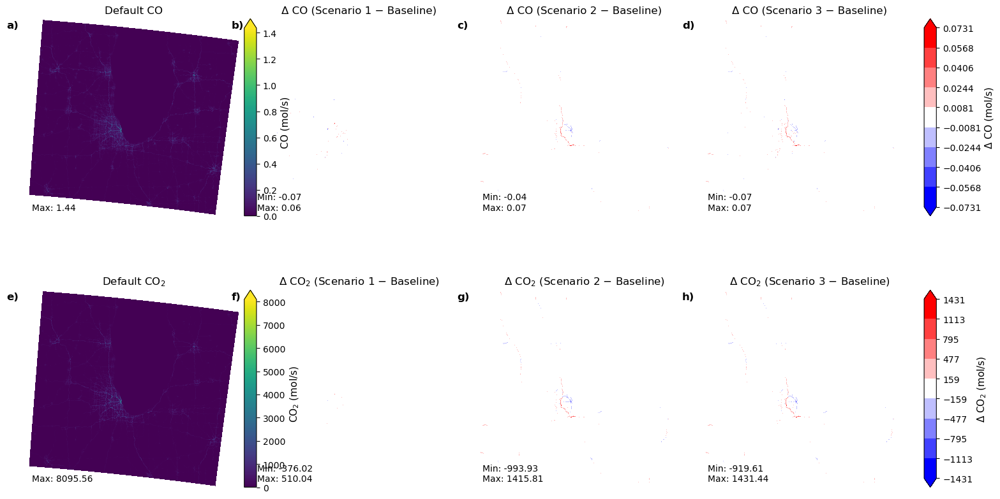

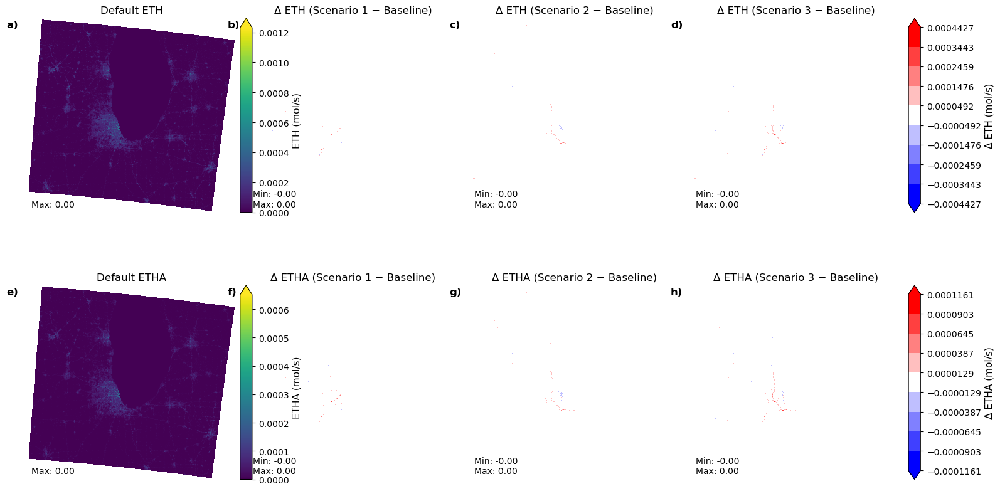

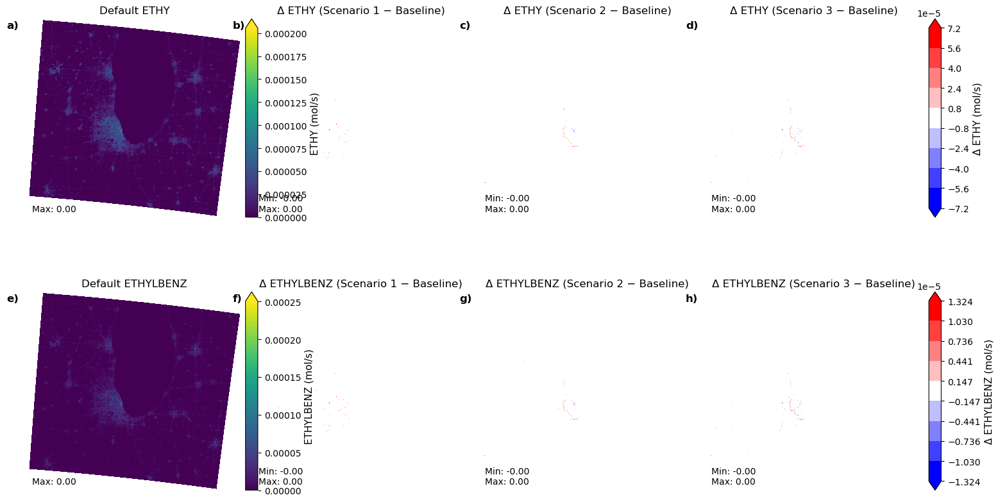

KeyboardInterrupt: 

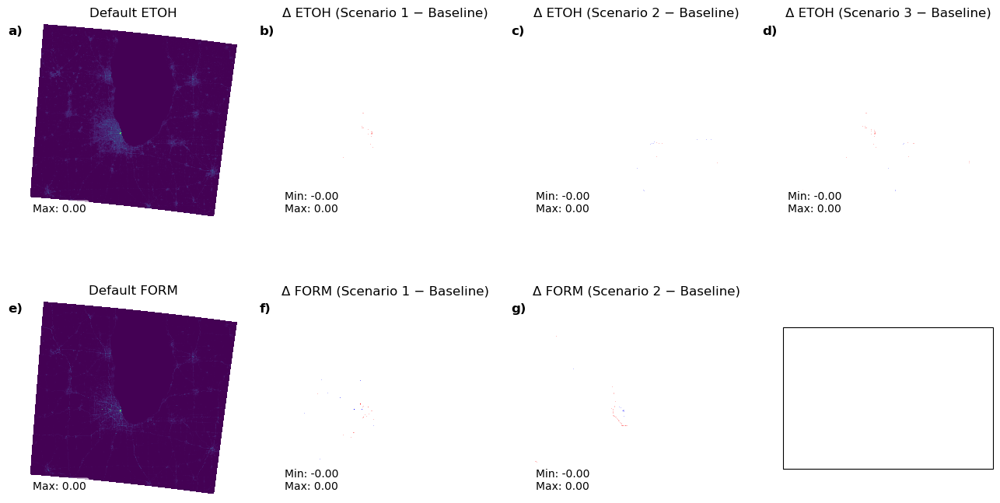

In [18]:
import os
import string
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs

# ============================================================
# OUTPUT DIRECTORY
# ============================================================
outdir = "All_Onroad_Columns_Figures_FULLDOMAIN"
os.makedirs(outdir, exist_ok=True)

# ============================================================
# USE FULL, PRE-CLIPPED DATASETS
# ============================================================
base_plot = onroad_total_base
s1_plot   = onroad_total_LOCUSIdling
s2_plot   = onroad_total_HDVSpatial
s3_plot   = onroad_total_LOCUSIdlingHDVSpatial

# ============================================================
# CMAQ / GRID EXTENT FROM PRE-CLIPPED DATA
# ============================================================
# Prefer explicit lon/lat columns if available
if ("lon" in base_plot.columns) and ("lat" in base_plot.columns):
    xmin = float(np.nanmin(base_plot["lon"]))
    xmax = float(np.nanmax(base_plot["lon"]))
    ymin = float(np.nanmin(base_plot["lat"]))
    ymax = float(np.nanmax(base_plot["lat"]))
else:
    xmin, ymin, xmax, ymax = base_plot.total_bounds

# small padding so maps do not sit flush against the frame
xpad = (xmax - xmin) * 0.01
ypad = (ymax - ymin) * 0.01
extent_xy = [xmin - xpad, xmax + xpad, ymin - ypad, ymax + ypad]

print("Full-domain plotting extent:", extent_xy)

# ============================================================
# OPTIONAL: EXCLUDE NON-SPECIES / HELPER COLUMNS
# ============================================================
exclude_cols = {
    "lat", "lon", "lat_m", "lon_m", "geometry"
}

# ============================================================
# HELPER FUNCTIONS
# ============================================================
def annotate_max(ax, vals, fmt="{:.2f}", color="black"):
    vals = np.asarray(vals, dtype=float)
    vals = vals[np.isfinite(vals)]
    vmax = float(np.max(vals)) if vals.size else np.nan
    ax.text(
        0.02, 0.02, f"Max: {fmt.format(vmax)}",
        transform=ax.transAxes, ha="left", va="bottom",
        fontsize=10, color=color,
        bbox=dict(facecolor="white", alpha=0.70, boxstyle="round,pad=0.25", linewidth=0)
    )

def annotate_minmax(ax, vals, fmt="{:.2f}", color="black"):
    vals = np.asarray(vals, dtype=float)
    vals = vals[np.isfinite(vals)]
    vmin = float(np.min(vals)) if vals.size else np.nan
    vmax = float(np.max(vals)) if vals.size else np.nan
    ax.text(
        0.02, 0.02, f"Min: {fmt.format(vmin)}\nMax: {fmt.format(vmax)}",
        transform=ax.transAxes, ha="left", va="bottom",
        fontsize=10, color=color,
        bbox=dict(facecolor="white", alpha=0.70, boxstyle="round,pad=0.25", linewidth=0)
    )

def annotate_panel_label(ax, label, loc="ul", fontsize=12):
    if loc == "ul":
        x, y, ha, va = -0.1, 0.99, "left", "top"
    elif loc == "ur":
        x, y, ha, va = 0.98, 0.98, "right", "top"
    else:
        raise ValueError("loc must be 'ul' or 'ur'")

    ax.text(
        x, y, label,
        transform=ax.transAxes,
        ha=ha, va=va,
        fontsize=fontsize,
        fontweight="bold",
        bbox=dict(
            facecolor="white",
            alpha=0.85,
            boxstyle="round,pad=0.20",
            linewidth=0
        )
    )

def make_discrete_diff_cmap_and_norm(vmin, vmax, n_bins=9, cmap_name="bwr"):
    bounds = np.linspace(vmin, vmax, n_bins + 1)
    cmap = plt.get_cmap(cmap_name, n_bins)
    norm = mcolors.BoundaryNorm(bounds, cmap.N, clip=True)
    return cmap, norm, bounds

def nice_label(col):
    mapping = {
        "NOX_peryear": "NO$_x$",
        "PM25_peryear": "PM$_{2.5}$",
        "SO2": "SO$_2$",
        "NH3": "NH$_3$",
        "NO2": "NO$_2$",
        "CH4": "CH$_4$",
        "HONO": "HONO",
        "PEC": "PEC",
        "POC": "POC",
        "PNH4": "PNH$_4$",
        "PNO3": "PNO$_3$",
        "PSO4": "PSO$_4$",
        "PMC": "PMC",
        "CO2_INV": "CO$_2$",
        "N2O_INV": "N$_2$O",
    }
    return mapping.get(col, col)

def units_label(col):
    if col.endswith("_peryear"):
        return "tons/km$^2$/year"
    else:
        return "mol/s"

def plot_gdf_column(ax, gdf, col, cmap, norm, vmin, vmax, title, ann="minmax", label=None):
    gdf.plot(
        column=col,
        ax=ax,
        cmap=cmap,
        norm=norm,
        edgecolor="none",
        antialiased=False,
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(title, fontsize=12)
    ax.set_extent(extent_xy, crs=ccrs.PlateCarree())
    ax.set_axis_off()

    vals = gdf[col].astype(float).to_numpy()
    if ann == "max":
        annotate_max(ax, vals, fmt="{:.2f}")
    else:
        annotate_minmax(ax, vals, fmt="{:.2f}")

    if label is not None:
        annotate_panel_label(ax, label)

def plot_array_panel(ax, template_gdf, arr, cmap, norm, vmin, vmax, title, ann="minmax", label=None):
    temp = template_gdf.copy()
    temp["_plotcol_"] = arr

    temp.plot(
        column="_plotcol_",
        ax=ax,
        cmap=cmap,
        norm=norm,
        edgecolor="none",
        antialiased=False,
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(title, fontsize=12)
    ax.set_extent(extent_xy, crs=ccrs.PlateCarree())
    ax.set_axis_off()

    if ann == "max":
        annotate_max(ax, arr, fmt="{:.2f}")
    else:
        annotate_minmax(ax, arr, fmt="{:.2f}")

    if label is not None:
        annotate_panel_label(ax, label)

# ============================================================
# FIND ALL NUMERIC COLUMNS TO PLOT
# ============================================================
all_vars = []

for col in base_plot.columns:
    if col in exclude_cols:
        continue

    if not np.issubdtype(base_plot[col].dtype, np.number):
        continue

    if col not in s1_plot.columns:
        continue
    if col not in s2_plot.columns:
        continue
    if col not in s3_plot.columns:
        continue

    all_vars.append(col)

print("Columns being plotted:")
for col in all_vars:
    print(col)

# ============================================================
# PLOT TWO VARIABLES PER FIGURE (2 ROWS x 4 COLS)
# ============================================================
for fig_idx in range(0, len(all_vars), 2):

    pair = all_vars[fig_idx:fig_idx+2]

    if len(pair) == 1:
        pair.append(None)

    fig, axs = plt.subplots(
        nrows=2, ncols=4, figsize=(16, 8.5),
        subplot_kw={"projection": ccrs.PlateCarree()}
    )

    panel_letters = list(string.ascii_lowercase)
    row_colorbar_info = []

    for row_i, col in enumerate(pair):

        if col is None:
            for j in range(4):
                axs[row_i, j].set_axis_off()
            continue

        species_label = nice_label(col)
        species_units = units_label(col)

        # --------------------------------------------------
        # BASELINE VALUES
        # --------------------------------------------------
        base_vals = base_plot[col].astype(float).to_numpy()
        base_vals = base_vals[np.isfinite(base_vals)]

        ABS_VMIN = float(np.min(base_vals)) if base_vals.size else 0.0
        ABS_VMAX = float(np.max(base_vals)) if base_vals.size else 1.0

        if ABS_VMIN == ABS_VMAX:
            ABS_VMAX = ABS_VMIN + 1e-12

        cmap_abs = plt.cm.viridis
        norm_abs = mcolors.Normalize(vmin=ABS_VMIN, vmax=ABS_VMAX)

        # --------------------------------------------------
        # DIFFERENCES COMPUTED ON THE FLY
        # --------------------------------------------------
        diff1 = (
            s1_plot[col].astype(float).to_numpy()
            - base_plot[col].astype(float).to_numpy()
        )
        diff2 = (
            s2_plot[col].astype(float).to_numpy()
            - base_plot[col].astype(float).to_numpy()
        )
        diff3 = (
            s3_plot[col].astype(float).to_numpy()
            - base_plot[col].astype(float).to_numpy()
        )

        all_diff = np.concatenate([diff1, diff2, diff3])
        all_diff = all_diff[np.isfinite(all_diff)]

        if all_diff.size == 0:
            DIFF_MAX = 1.0
        else:
            DIFF_MAX = float(np.max(np.abs(all_diff)))
            if DIFF_MAX == 0:
                DIFF_MAX = 1.0

        DIFF_MIN = -DIFF_MAX

        cmap_diff, norm_diff, diff_bounds = make_discrete_diff_cmap_and_norm(
            DIFF_MIN, DIFF_MAX, n_bins=9, cmap_name="bwr"
        )

        # --------------------------------------------------
        # PANEL LABELS
        # --------------------------------------------------
        letter_base = panel_letters[row_i * 4 + 0] + ")"
        letter_s1   = panel_letters[row_i * 4 + 1] + ")"
        letter_s2   = panel_letters[row_i * 4 + 2] + ")"
        letter_s3   = panel_letters[row_i * 4 + 3] + ")"

        # --------------------------------------------------
        # BASELINE PANEL
        # --------------------------------------------------
        plot_gdf_column(
            axs[row_i, 0],
            base_plot,
            col,
            cmap_abs,
            norm_abs,
            ABS_VMIN,
            ABS_VMAX,
            f"Default {species_label}",
            ann="max",
            label=letter_base
        )

        # --------------------------------------------------
        # DIFFERENCE PANELS
        # --------------------------------------------------
        plot_array_panel(
            axs[row_i, 1],
            base_plot,
            diff1,
            cmap_diff,
            norm_diff,
            DIFF_MIN,
            DIFF_MAX,
            f"Δ {species_label} (Scenario 1 − Baseline)",
            ann="minmax",
            label=letter_s1
        )

        plot_array_panel(
            axs[row_i, 2],
            base_plot,
            diff2,
            cmap_diff,
            norm_diff,
            DIFF_MIN,
            DIFF_MAX,
            f"Δ {species_label} (Scenario 2 − Baseline)",
            ann="minmax",
            label=letter_s2
        )

        plot_array_panel(
            axs[row_i, 3],
            base_plot,
            diff3,
            cmap_diff,
            norm_diff,
            DIFF_MIN,
            DIFF_MAX,
            f"Δ {species_label} (Scenario 3 − Baseline)",
            ann="minmax",
            label=letter_s3
        )

        row_colorbar_info.append({
            "row_i": row_i,
            "species_label": species_label,
            "species_units": species_units,
            "norm_abs": norm_abs,
            "cmap_abs": cmap_abs,
            "norm_diff": norm_diff,
            "cmap_diff": cmap_diff,
            "diff_bounds": diff_bounds
        })

    # ------------------------------------------------------
    # LAYOUT FIRST
    # ------------------------------------------------------
    plt.tight_layout()
    fig.subplots_adjust(left=0.03, right=0.90, wspace=0.06, hspace=0.08)
    fig.canvas.draw()

    # ------------------------------------------------------
    # ADD COLORBARS AFTER LAYOUT IS FINAL
    # ------------------------------------------------------
    for info in row_colorbar_info:
        row_i = info["row_i"]

        pos_col1 = axs[row_i, 0].get_position()
        pos_col4 = axs[row_i, 3].get_position()

        cax_abs = fig.add_axes([
            pos_col1.x1 + 0.004,
            pos_col1.y0,
            0.012,
            pos_col1.height
        ])

        cax_diff = fig.add_axes([
            pos_col4.x1 + 0.008,
            pos_col4.y0,
            0.012,
            pos_col4.height
        ])

        cb_abs = fig.colorbar(
            plt.cm.ScalarMappable(norm=info["norm_abs"], cmap=info["cmap_abs"]),
            cax=cax_abs,
            extend="max"
        )
        cb_abs.set_label(
            f"{info['species_label']} ({info['species_units']})",
            fontsize=11
        )

        cb_diff = fig.colorbar(
            plt.cm.ScalarMappable(norm=info["norm_diff"], cmap=info["cmap_diff"]),
            cax=cax_diff,
            boundaries=info["diff_bounds"],
            ticks=info["diff_bounds"],
            spacing="proportional",
            extend="both"
        )
        cb_diff.set_label(
            f"Δ {info['species_label']} ({info['species_units']})",
            fontsize=11
        )

    # ------------------------------------------------------
    # SAVE FIGURE
    # ------------------------------------------------------
    start_var = pair[0] if pair[0] is not None else "NA"
    end_var   = pair[1] if pair[1] is not None else "NA"

    fname = f"{fig_idx//2 + 1:02d}_{start_var}_to_{end_var}.png"
    fpath = os.path.join(outdir, fname)

    plt.savefig(fpath, dpi=300, bbox_inches="tight")
    plt.show()
    plt.close(fig)

print(f"Done. All figures saved to: {outdir}")